In [1]:
import toml
import warnings
import rl_analysis
import colorcet as cc

from scipy import signal
from collections import defaultdict
from toolz import compose, partial, valmap, keymap, valfilter, dissoc, keyfilter
from rl_analysis.dlight.io import dlight_exclude, dlight_exclude_toml
from rl_analysis.rl_photometry.io import load_full_beh_df, load_offline_dlight_snippet_features_new, NONSYLL_COLS
from rl_analysis.plotting import save_factory, add_legend, add_identity
from rl_analysis.paper2020 import setup_plotting_env, clean_ticks
from rl_analysis.rl_photometry.win_da_features import window_trials_pro, window_trials_as_mtx
from rl_analysis.util import zscore, syll_onset

warnings.simplefilter('ignore')
base_dir = dirname(dirname(rl_analysis.__file__))

from scipy.spatial.distance import squareform, pdist, cdist

In [3]:
with open(join(base_dir, 'analysis_configuration.toml'), 'r') as f:
    config = toml.load(f)

In [4]:
setup_plotting_env()

saver = save_factory(join(config['figures']['dir_wg'], 'variability-fig'), tight_layout=False)

plt.rcParams['figure.dpi'] = 300

In [5]:
use_dct = dlight_exclude_toml(
    "/home/wg41/reinforcement_data/_proc_photometry_dlight/dlight_photometry_processed_full.toml",
    **config["dlight_common"]
)

In [6]:
df = pd.read_parquet(
    join(config["data_dirs"]["root_wg"], config["intermediate_results"]["dlight_wg"]),
    filters=[("uuid", "in", list(use_dct)), ("area", "=", "dls")],
)

df = df[~df['session_number'].isin([3, 4])]
df = df.drop(columns=NONSYLL_COLS)
df = df.sort_index()

In [7]:
df['offline onset'] = False
df.loc[df.index[syll_onset(df['predicted_syllable (offline)'])], 'offline onset'] = True

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11649069 entries, 53860 to 53058788
Data columns (total 59 columns):
 #   Column                             Dtype         
---  ------                             -----         
 0   predicted_syllable                 float64       
 1   pc00                               float32       
 2   pc01                               float32       
 3   pc02                               float32       
 4   pc03                               float32       
 5   pc04                               float32       
 6   pc05                               float32       
 7   pc06                               float32       
 8   pc07                               float32       
 9   pc08                               float32       
 10  pc09                               float32       
 11  date                               datetime64[ns]
 12  syllable_group                     float64       
 13  target_syllable                    float64       
 

In [8]:
feat_df, _ = load_offline_dlight_snippet_features_new(win_left=0)
feat_df = feat_df[feat_df['uuid'].isin(df['uuid'].unique())]

In [9]:
# load offline syllable stats
with open(join(config['data_dirs']['root_wg'], config['intermediate_results']['dlight_syllable_stats']['offline']), 'r') as f:
    syll_stats = toml.load(f)
    relabel_map = keymap(int, syll_stats['syllable_to_sorted_idx'])
    # Filter rare syllables
    relabel_map = valfilter(lambda v: v < syll_stats['truncate'], relabel_map)
    # del relabel_map[-5]

In [10]:
sorting = joblib.load('/home/wg41/reinforcement_data/dlight_photometry/fig1-syllable-sorting.p')

In [11]:
sorting

{41: 0,
 5: 1,
 44: 2,
 27: 3,
 17: 4,
 94: 5,
 39: 6,
 72: 7,
 15: 8,
 66: 9,
 57: 10,
 45: 11,
 86: 12,
 29: 13,
 56: 14,
 20: 15,
 12: 16,
 43: 17,
 74: 18,
 67: 19,
 73: 20,
 58: 21,
 13: 22,
 95: 23,
 76: 24,
 22: 25,
 33: 26,
 8: 27,
 19: 28,
 7: 29,
 71: 30,
 4: 31,
 30: 32,
 42: 33,
 25: 34,
 91: 35,
 59: 36}

In [12]:
def dlight_filter(ser):
    soscoeffs = signal.bessel(1, 1 / (30 / 2.), btype="high", output="sos")
    sig = ser.dropna()
    new_ser = pd.Series(index=ser.index)
    new_ser.loc[sig.index] = signal.sosfiltfilt(soscoeffs, sig)
    return new_ser

In [13]:
df['dlight filtered'] = df.groupby('uuid', sort=False, observed=True)['signal_reref_dff_z'].transform(dlight_filter)

In [14]:
time_window = (-1.5, 1.5)

# Z-scored dF/F0

In [15]:
# dlight_key = "signal_reref_dff_z"
dlight_key = "dlight filtered"

mouse_data = {}
for mouse, mouse_df in tqdm(df.groupby('mouse_id', observed=True)):
    inds = np.where(mouse_df['offline onset'])[0]
    time, trials = window_trials_as_mtx(mouse_df, inds, dlight_key, zscore_signal=True, truncation_window=time_window)
    mouse_data[mouse] = trials

means = valmap(lambda v: np.nanmean(v, axis=0), mouse_data)

  0%|          | 0/14 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [16]:
time, total_trials = window_trials_as_mtx(
    df,
    np.where(df["offline onset"])[0],
    dlight_key,
    zscore_signal=True,
    truncation_window=time_window,
)

In [17]:
total_trials.shape

(689261, 91)

In [28]:
agg_df, trial_df = window_trials_pro(
    df,
    np.where(df["offline onset"])[0],
    dlight_key,
    zscore_signal=True,
    truncation_window=time_window,
    agg_window=(0, 0.3),
)

In [29]:
agg_df.head()

,mu,std,max,min,robust_range,range,slope,labels,trial_index
0,-0.033083,0.854510,0.922182,-1.477168,1.760103,2.033195,1.161173,95.0,487
1,-0.072744,0.558815,1.522971,-0.343620,2.832800,2.957186,0.450144,41.0,496
2,-0.055105,0.631305,1.694579,-0.634934,1.787383,2.329513,0.795907,53.0,523
3,0.049396,0.661583,0.669694,-1.300503,1.788681,1.970197,0.719953,92.0,568
4,0.073703,0.698499,0.684796,-1.097536,1.790131,1.971794,0.375771,13.0,574


In [32]:
trial_df.head()

,dlight,time,real_syllable,aligned_syllable,trials
0,-1.045194,-1.500000,27,95,0
1,-0.612868,-1.466667,27,95,0
2,-0.122992,-1.433333,27,95,0
3,-0.212278,-1.400000,27,95,0
4,-0.063780,-1.366667,27,95,0


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


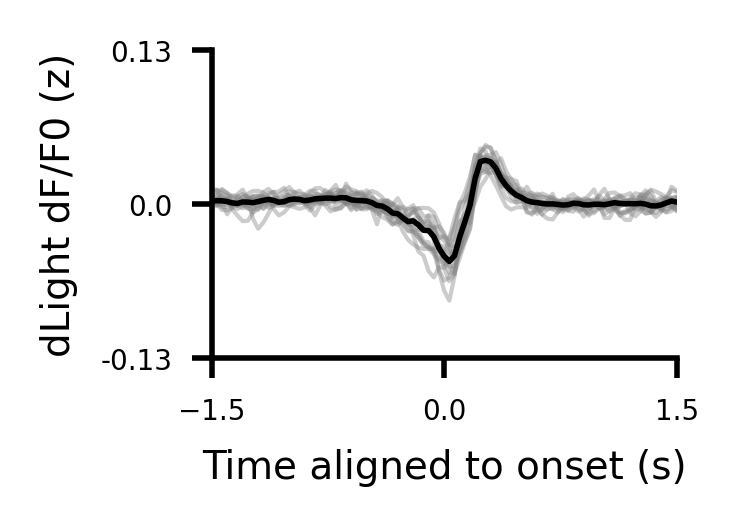

In [17]:
fig = fg(1.5, 1)
fig.dpi = 200
ax = fig.gca()
for k, v in means.items():
    ax.plot(time, v, lw=0.75, c="gray", alpha=0.4)
ax.plot(time, np.nanmean(total_trials, axis=0), lw=1, c="k")
ax.set(
    xlim=time_window,
    xlabel="Time aligned to onset (s)",
    ylabel="dLight dF/F0 (z)",
    xticks=(time_window[0], 0, time_window[1]),
    ylim=(-0.13, 0.13),
)
clean_ticks(ax, axis="y", zero_symmetry=False)
sns.despine()
saver(fig, "filtered-grand-average-per-mouse");

## Try plotting grand average waveforms per session

In [18]:
session_data = defaultdict(list)
for (mouse, uuid), mouse_df in tqdm(df.groupby(['mouse_id', 'uuid'], observed=True)):
    inds = np.where(mouse_df['offline onset'])[0]
    time, trials = window_trials_as_mtx(mouse_df, inds, dlight_key, zscore_signal=True, truncation_window=time_window)
    session_data[mouse].append(np.nanmean(trials, axis=0))

  0%|          | 0/216 [00:00<?, ?it/s]

In [19]:
mouse_boundaries = valmap(len, session_data)

In [20]:
mouse_boundaries

{'dls-dlight-1': 18,
 'dls-dlight-2': 19,
 'dls-dlight-3': 20,
 'dls-dlight-4': 17,
 'dls-dlight-5': 17,
 'dls-dlight-7': 13,
 'dlight-chrimson-1': 15,
 'dlight-chrimson-3': 21,
 'dlight-chrimson-5': 21,
 'dlight-chrimson-2': 15,
 'dlight-chrimson-4': 8,
 'dlight-chrimson-6': 21,
 'dlight-chrimson-8': 5,
 'dlight-chrimson-9': 6}

In [21]:
means = np.concatenate(list(session_data.values()))

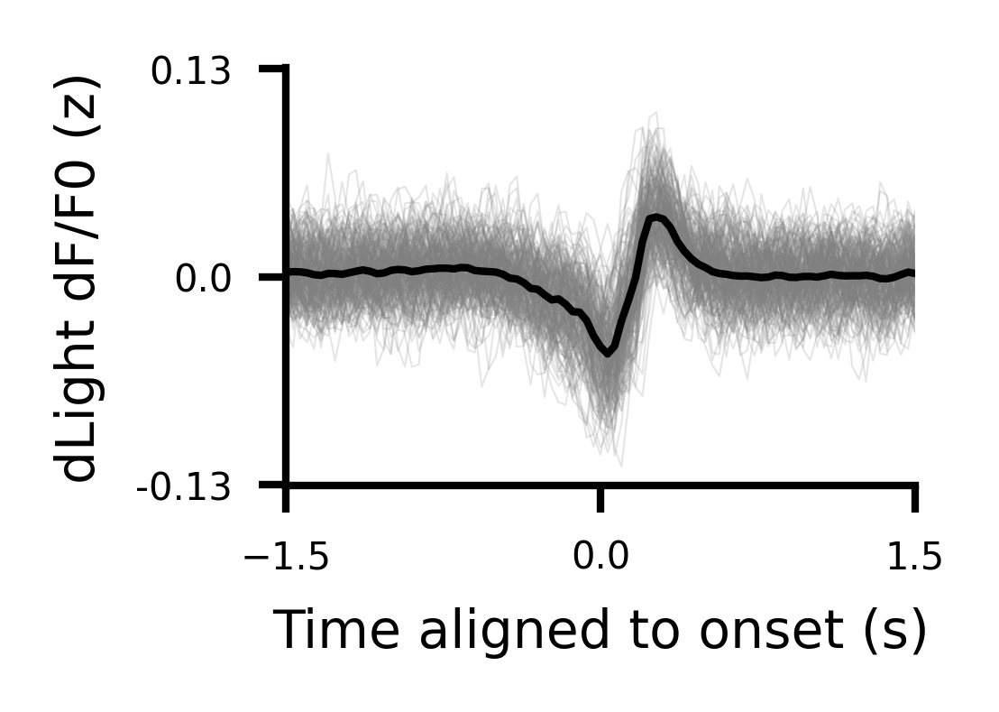

In [22]:
fig = fg(1.5, 1)
fig.dpi = 300
ax = fig.gca()
ax.plot(time, means.T, lw=0.25, c="gray", alpha=0.2)
ax.plot(time, np.nanmean(total_trials, axis=0), lw=1, c="k")
ax.set(
    xlim=time_window,
    xlabel="Time aligned to onset (s)",
    ylabel="dLight dF/F0 (z)",
    xticks=(time_window[0], 0, time_window[1]),
    ylim=(-0.13, 0.13),
)
clean_ticks(ax, axis="y", zero_symmetry=False)
sns.despine()
saver(fig, "filtered-grand-average-per-session");

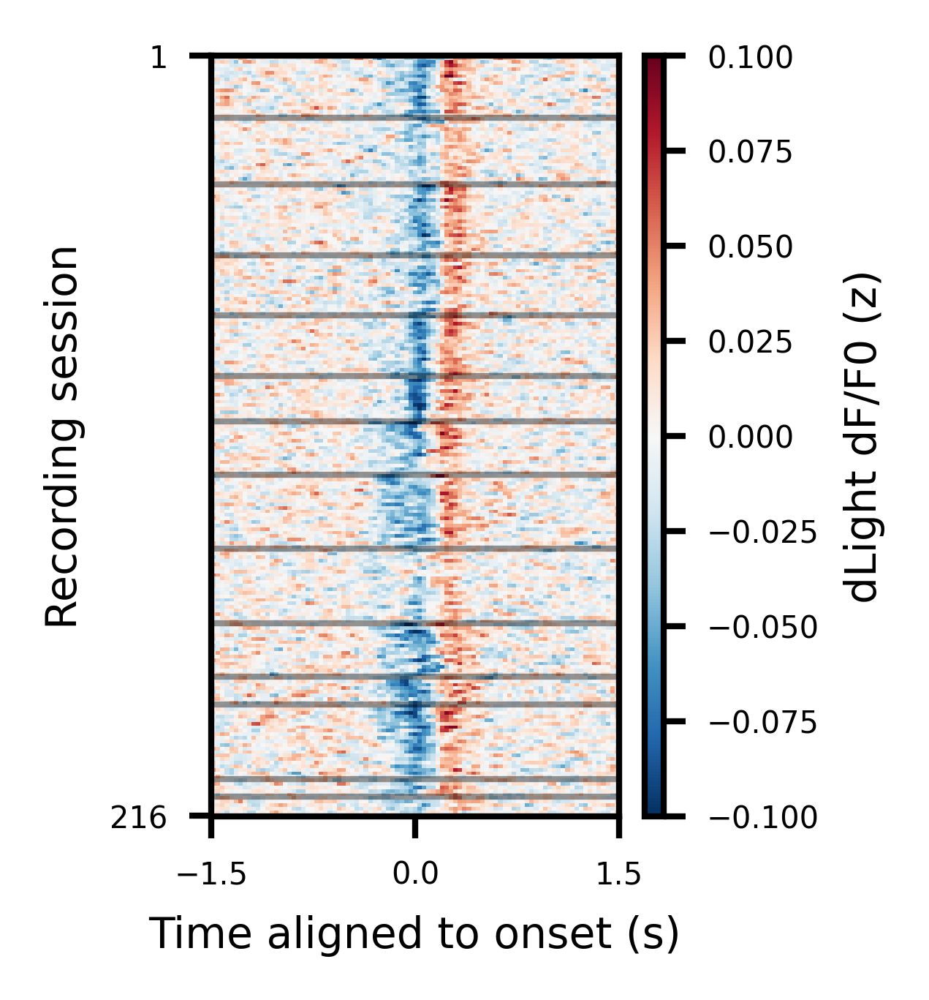

In [23]:
fig = fg(1.5, 2.25)
fig.dpi = 300
ax = fig.gca()
im = ax.imshow(
    means,
    cmap="RdBu_r",
    vmin=-0.10,
    vmax=0.10,
    aspect="auto",
    extent=(time[0], time[-1], len(means), 0),
)
for v in np.cumsum(list(mouse_boundaries.values())):
    ax.axhline(v, color='k', linestyle='-', lw=1, alpha=0.4)
ax.set(
    xticks=[time_window[0], 0, time_window[1]],
    xlim=time_window,
    yticks=[0.5, len(means) - 0.5],
    yticklabels=[1, len(means)],
    ylabel="Recording session",
    xlabel="Time aligned to onset (s)",
    ylim=(len(means) - 0.5, 0.5),
)
fig.colorbar(im, ax=ax, label="dLight dF/F0 (z)", aspect=40)
saver(fig, 'filtered-dlight-aligned-per-session');

## Plot distribution of DA peak instances per syllable

In [24]:
sylls = feat_df['syllable'].value_counts()

In [25]:
quant_range = 0.99
edges = np.histogram_bin_edges(feat_df['signal_reref_dff_z_max'].dropna(), bins=75, range=(-0.95, feat_df['signal_reref_dff_z_max'].quantile(quant_range)))
x = edges[:-1] + (np.diff(edges) / 2)

dists = []
avgs = []
for syll in sorting:
    tmp = feat_df.loc[feat_df['syllable'] == syll, 'signal_reref_dff_z_max']
    dist, _bins = np.histogram(tmp, edges, density=True)
    dists.append(dist)
    avgs.append(tmp.mean())

dists = np.array(dists)

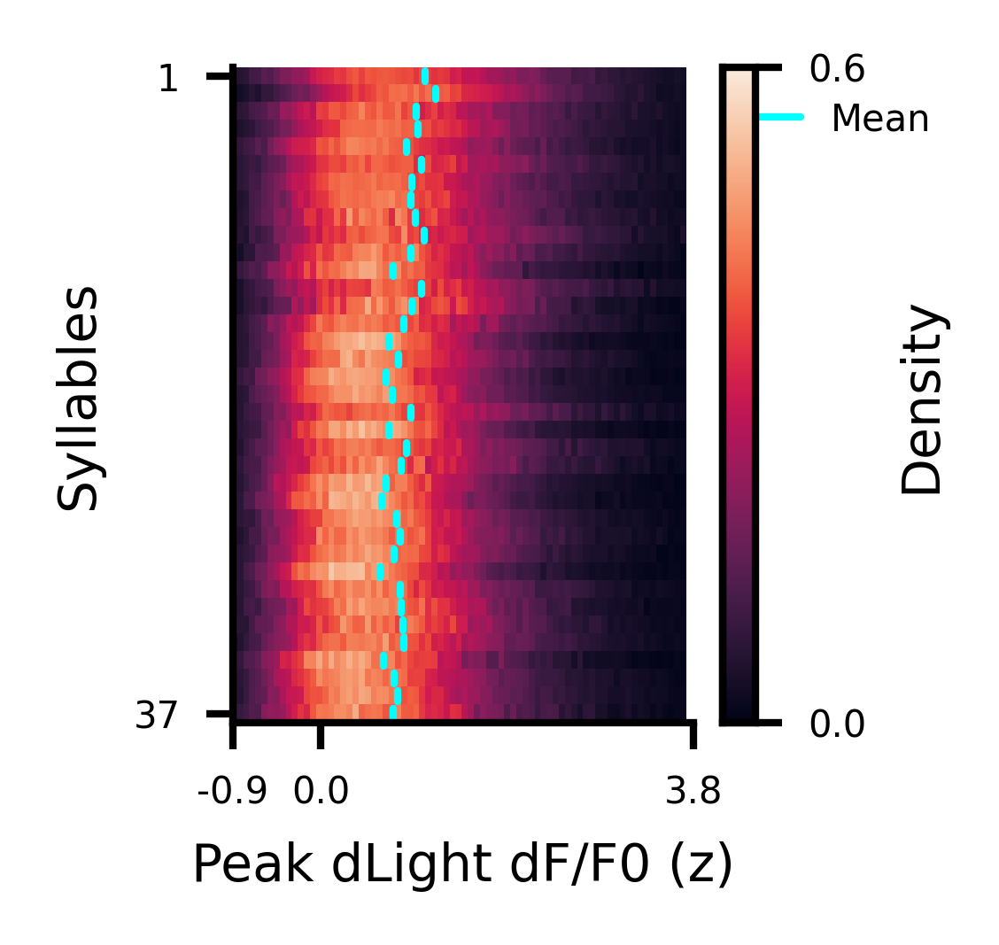

In [26]:
pad = 0.2
fig = fg(1.4, 1.6)
fig.dpi = 300
ax = fig.gca()
im = ax.imshow(
    dists, aspect="auto", extent=(x[0], x[-1], len(sorting), 0), vmax=0.6, interpolation="none"
)
cb = fig.colorbar(im, ax=ax, label="Density")
cb.set_ticks([0, 0.6])
for i in range(len(avgs)):
    plt.plot((avgs[i],) * 2, (i + pad, i + (1 - pad)), lw=1, c="cyan", label='Mean' if i == 0 else None)
ax.set(
    xlabel="Peak dLight dF/F0 (z)",
    ylabel="Syllables",
    yticks=[0.5, len(sorting) - 0.5],
    yticklabels=[1, len(sorting)],
    ylim=(len(sorting), 0),
    xlim=(-0.9, None),
)
clean_ticks(ax, axis="x", zero_symmetry=False, precision=1)
sns.despine()
add_legend(ax)
saver(fig, "prob-density-of-dlight-instances");

In [27]:
avg_peak_dlight = feat_df.groupby(['uuid', 'syllable'])['signal_reref_dff_z_max'].mean().reset_index()

In [28]:
avg_peak_dlight

,uuid,syllable,signal_reref_dff_z_max
0,002d0da8-3f75-4d23-b31d-c20ebd3ba5e4,4,0.729855
1,002d0da8-3f75-4d23-b31d-c20ebd3ba5e4,5,1.253740
2,002d0da8-3f75-4d23-b31d-c20ebd3ba5e4,7,0.961223
3,002d0da8-3f75-4d23-b31d-c20ebd3ba5e4,8,1.091354
4,002d0da8-3f75-4d23-b31d-c20ebd3ba5e4,10,0.828271
...,...,...,...
12172,ff5d0771-82cb-4a21-b014-979499700e41,86,1.319876
12173,ff5d0771-82cb-4a21-b014-979499700e41,91,0.915261
12174,ff5d0771-82cb-4a21-b014-979499700e41,92,0.909086
12175,ff5d0771-82cb-4a21-b014-979499700e41,94,1.081031


## Plot distribution of avg DA peaks per session and per syllable

In [29]:
quant_range = 0.99
# edges = np.histogram_bin_edges(avg_peak_dlight['signal_reref_dff_z_max'].dropna(), bins=38, range=avg_peak_dlight['signal_reref_dff_z_max'].quantile([1-quant_range, quant_range]))
edges = np.histogram_bin_edges(avg_peak_dlight['signal_reref_dff_z_max'].dropna(), bins=38, range=(-0.05, avg_peak_dlight['signal_reref_dff_z_max'].quantile(quant_range)))
x = edges[:-1] + (np.diff(edges) / 2)

avg_dists = []
avg_means = []
for syll in sorting:
    tmp = avg_peak_dlight.loc[avg_peak_dlight['syllable'] == syll, 'signal_reref_dff_z_max']
    dist, _bins = np.histogram(tmp, edges, density=True)
    avg_dists.append(dist)
    avg_means.append(tmp.mean())

avg_dists = np.array(avg_dists)

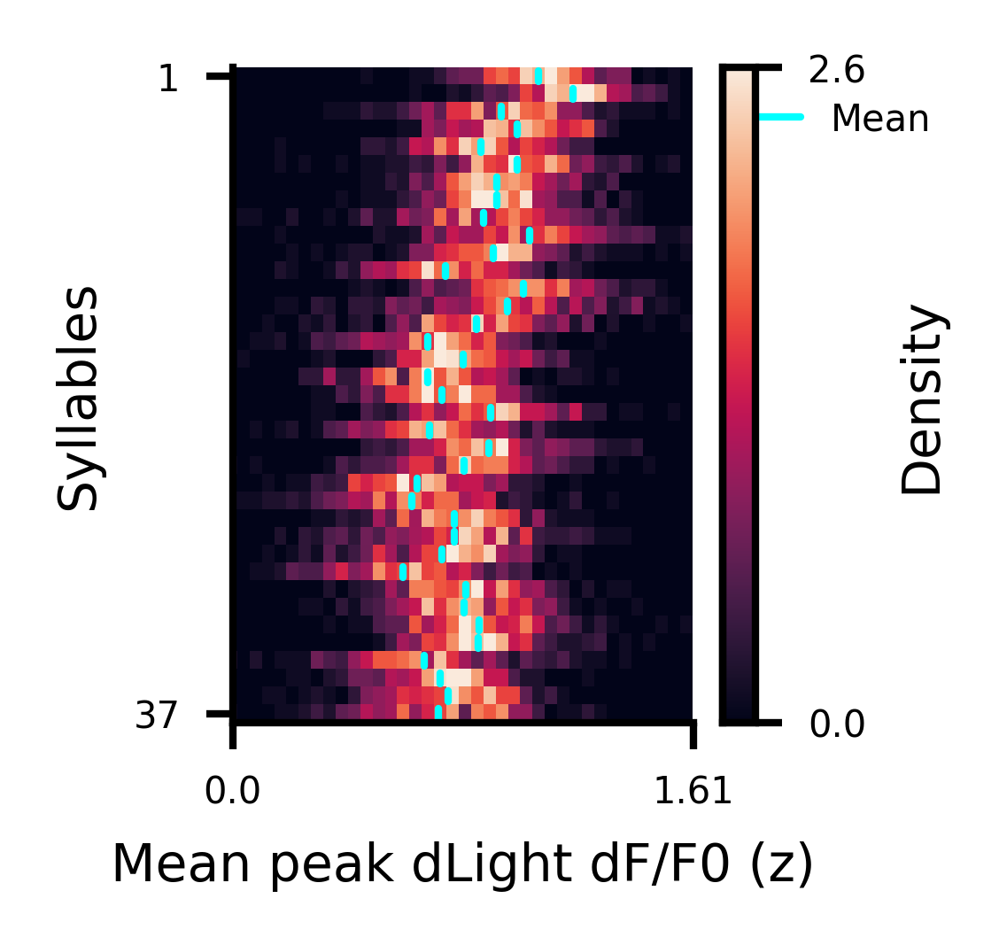

In [30]:
pad = 0.2
fig = fg(1.4, 1.6)
fig.dpi = 300
ax = fig.gca()
im = ax.imshow(
    avg_dists,
    aspect="auto",
    extent=(x[0], x[-1], len(sorting), 0),
    vmax=2.6,
    interpolation="none",
)
# im = ax.imshow(avg_dists, aspect='auto', vmax=2.6, interpolation='none')
cb = fig.colorbar(im, ax=ax, label="Density")
for i in range(len(avg_dists)):
    plt.plot((avg_means[i],) * 2, (i + pad, i + (1 - pad)), lw=1, c="cyan", label='Mean' if i == 0 else None)
cb.set_ticks([0, 2.6])
ax.set(
    xlabel="Mean peak dLight dF/F0 (z)",
    ylabel="Syllables",
    yticks=[0.5, len(sorting) - 0.5],
    yticklabels=[1, len(sorting)],
    ylim=(len(sorting), 0),
    xlim=(0, None),
)
clean_ticks(ax, axis="x", dtype=float, zero_symmetry=False, precision=2)
sns.despine()
add_legend(ax)
saver(fig, "prob-density-of-avg-dlight-across-sessions");

<AxesSubplot:xlabel='signal_reref_dff_z_max', ylabel='Count'>

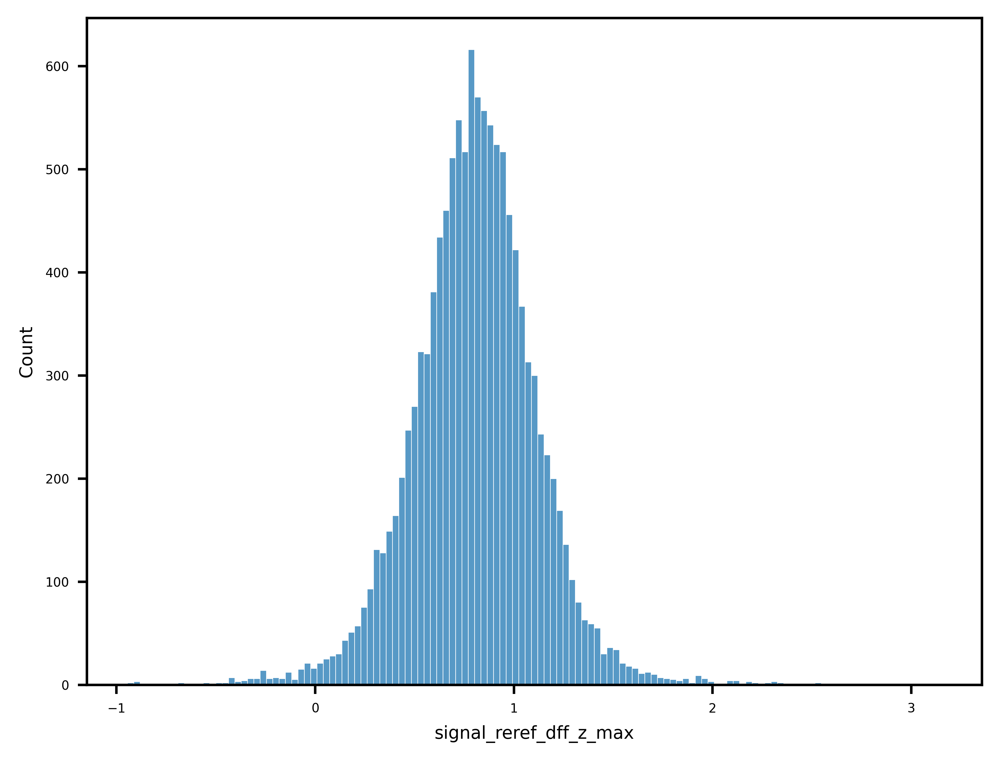

In [31]:
sns.histplot(avg_peak_dlight['signal_reref_dff_z_max'])

## Gather ave syllable waveforms for each session 

- [x] TODO just show the 37 syllables used in fig 1, sort with same sorting

In [32]:
waveforms = defaultdict(list)
peaks = defaultdict(list)

for k, _df in tqdm(df.groupby(['mouse_id', 'uuid'], sort=False, observed=True)):
    feat_session = feat_df[feat_df['uuid'] == k[1]]
    for syll in sorting:
        inds = np.where((_df['predicted_syllable (offline)'] == syll) & _df['offline onset'])[0]
        if len(inds) > 0:
            time, mtx = window_trials_as_mtx(_df, inds, dlight_key, truncation_window=time_window)
            waveforms[syll].append(np.nanmean(mtx, axis=0))
            # grab avg peak DA
            _avg_peak_da = feat_session.loc[feat_session['syllable'] == syll, 'signal_reref_dff_z_max'].mean()
            peaks[syll].append(_avg_peak_da)
waveforms = dict(waveforms)
peaks = dict(peaks)

  0%|          | 0/216 [00:00<?, ?it/s]

In [40]:
all_peaks = np.concatenate([peaks[k] for k in sorting])

everything = np.concatenate([waveforms[k] for k in sorting], axis=0)
mask = np.all(np.isnan(everything), axis=1)

# show re-ordered syll labels
syll_labels = []
for k in sorting:
    syll_labels.extend(np.repeat([sorting[k]], len(waveforms[k])))
syll_labels = np.array(syll_labels)

everything = everything[~mask]
syll_labels = syll_labels[~mask]
all_peaks = all_peaks[~mask]

cumulative = pd.Series(syll_labels).value_counts().reindex(sorting.values())
boundaries = cumulative.cumsum()

In [41]:
np.linspace(0, len(syll_labels), len(sorting), dtype=int)

array([   0,  221,  443,  665,  887, 1109, 1331, 1553, 1775, 1997, 2219,
       2441, 2663, 2885, 3107, 3329, 3551, 3773, 3995, 4217, 4439, 4661,
       4883, 5105, 5327, 5549, 5771, 5993, 6215, 6437, 6659, 6881, 7103,
       7325, 7547, 7769, 7991])

In [42]:
sylls, counts = np.unique(syll_labels, return_counts=True)

In [43]:
offset = counts[0] // 2

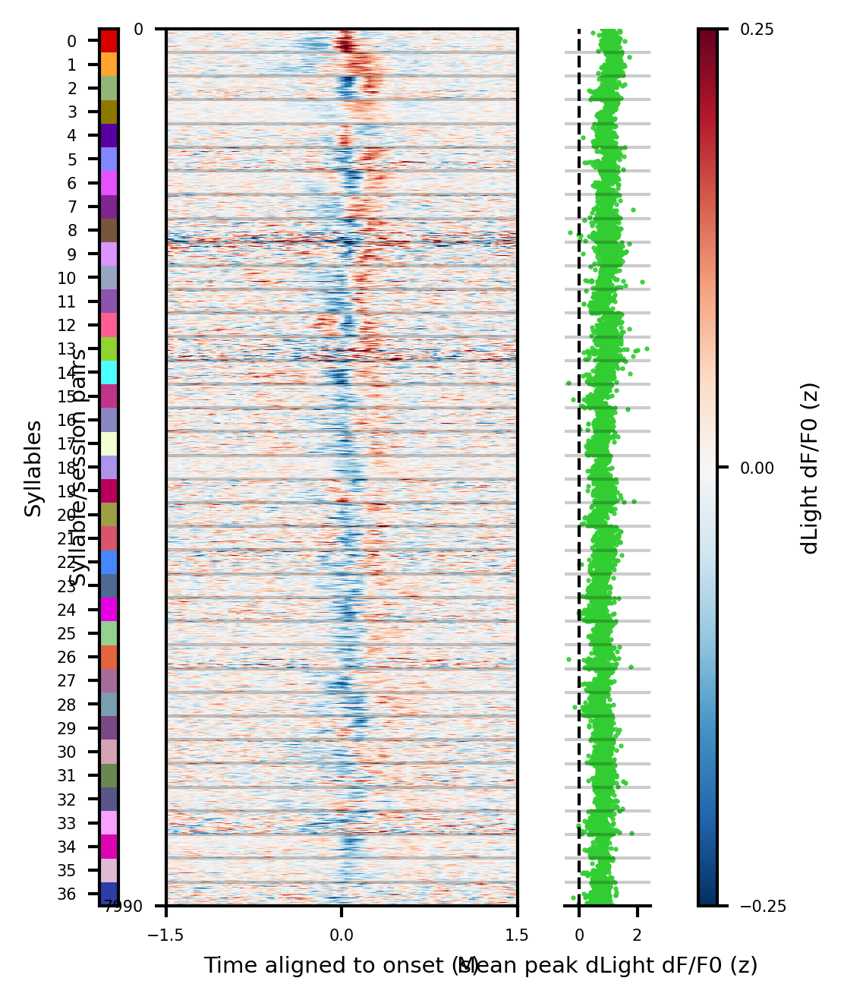

In [54]:
# fig, ax = subplots(1, 2, 1.3, 1, gridspec_kws={})
color_range = 0.25
fig, ax_dict = plt.subplot_mosaic(
    "ABBBBBBCCD",
    figsize=(3.5, 5),
)
fig.dpi = 150
ax_dict["A"].imshow(
    syll_labels[:, None],
    aspect="auto",
    cmap=cc.cm.glasbey,
    extent=(0, 1, len(everything) - 0.5, 0.5),
    interpolation="none", 
)
ax_dict["A"].set(
    xticks=[],
    ylabel="Syllables",
    yticks=np.linspace(offset, len(syll_labels) - offset, len(sorting)),
    yticklabels=sorting.values(),
)
im = ax_dict["B"].imshow(
    everything,
    aspect="auto",
    cmap="RdBu_r",
    vmin=-color_range,
    vmax=color_range,
    extent=(time[0], time[-1], len(everything), 0),
    #interpolation="none", # NOTE: uncomment and smooth actual data in future
)
ax_dict["B"].set(
    xlabel="Time aligned to onset (s)",
    ylabel="Syllable/session pairs",
    yticks=[0.5, len(everything) - 0.5],
    xticks=[time[0], 0, time[-1]],
)
for _, v in boundaries.iteritems():
    ax_dict["B"].axhline(v, lw=1, ls="-", c="k", alpha=0.2)
ax_dict["C"].plot(all_peaks, np.arange(len(all_peaks)), ".", c="limegreen", ms=1)
ax_dict["C"].axvline(0, lw=1, ls="--", c="k")
ax_dict["C"].set(ylim=(0, len(all_peaks) - 1), yticks=[], xlabel="Mean peak dLight dF/F0 (z)")
ax_dict["C"].invert_yaxis()
for _, v in boundaries.iteritems():
    ax_dict["C"].axhline(v, lw=1, ls="-", c="k", alpha=0.2)
# clean_ticks(ax_dict['C'], zero_symmetry=False, precision=1)
sns.despine(ax=ax_dict["C"], left=True)

cb = fig.colorbar(im, cax=ax_dict["D"], label="dLight dF/F0 (z)", aspect=60)
cb.set_ticks([-color_range, 0, color_range])
plt.subplots_adjust(wspace=2.5)

saver(fig, "avg-filtered-dlight-waveforms-for-all-syllables-and-sessions");

## break out some syllables

In [32]:
# OR [5, 86, 25]
breakouts = np.array(list(sorting))[[1, 12, -3]]

In [33]:
breakouts

array([ 5, 86, 25])

In [34]:
waveforms = defaultdict(list)
peaks = defaultdict(list)

for k, _df in tqdm(df.groupby(['mouse_id', 'uuid'], sort=False, observed=True)):
    feat_session = feat_df[feat_df['uuid'] == k[1]]
    for syll in breakouts:
        inds = np.where((_df['predicted_syllable (offline)'] == syll) & _df['offline onset'])[0]
        if len(inds) > 0:
            time, mtx = window_trials_as_mtx(_df, inds, dlight_key, truncation_window=time_window)
            waveforms[syll].append(np.nanmean(mtx, axis=0))
            # grab avg peak DA
            _avg_peak_da = feat_session.loc[feat_session['syllable'] == syll, 'signal_reref_dff_z_max'].mean()
            peaks[syll].append(_avg_peak_da)
waveforms = dict(waveforms)
peaks = dict(peaks)

  0%|          | 0/216 [00:00<?, ?it/s]

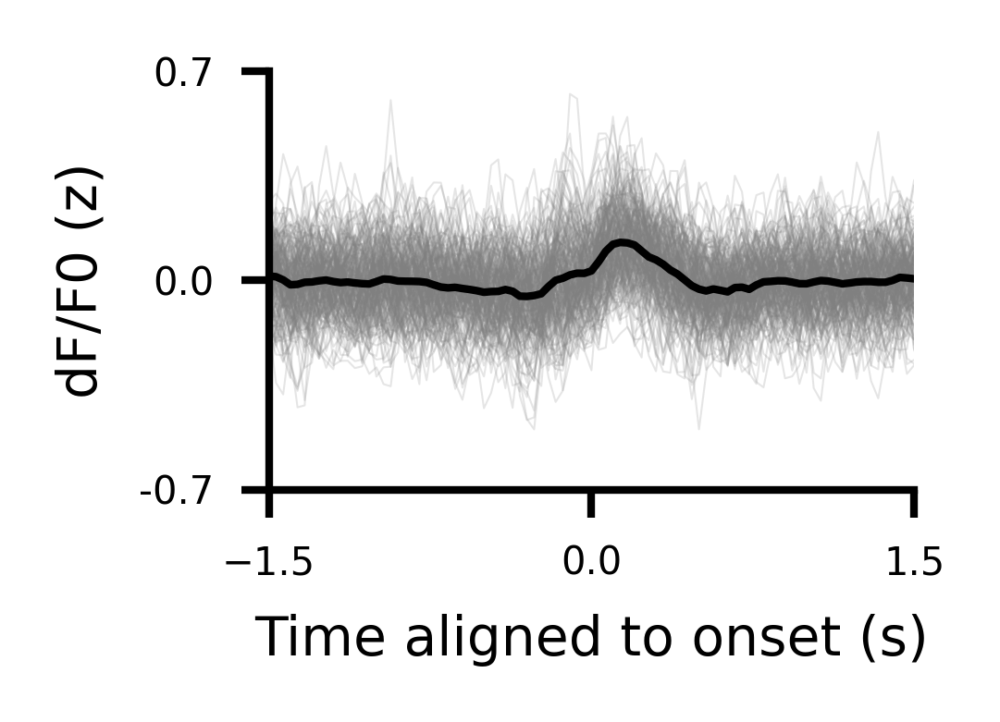

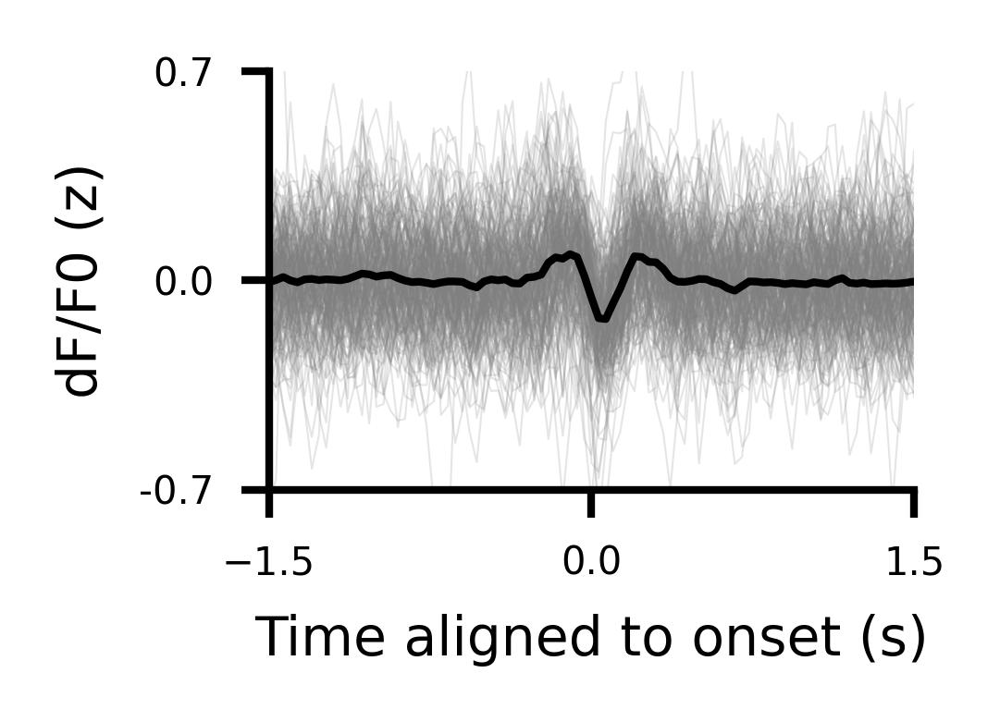

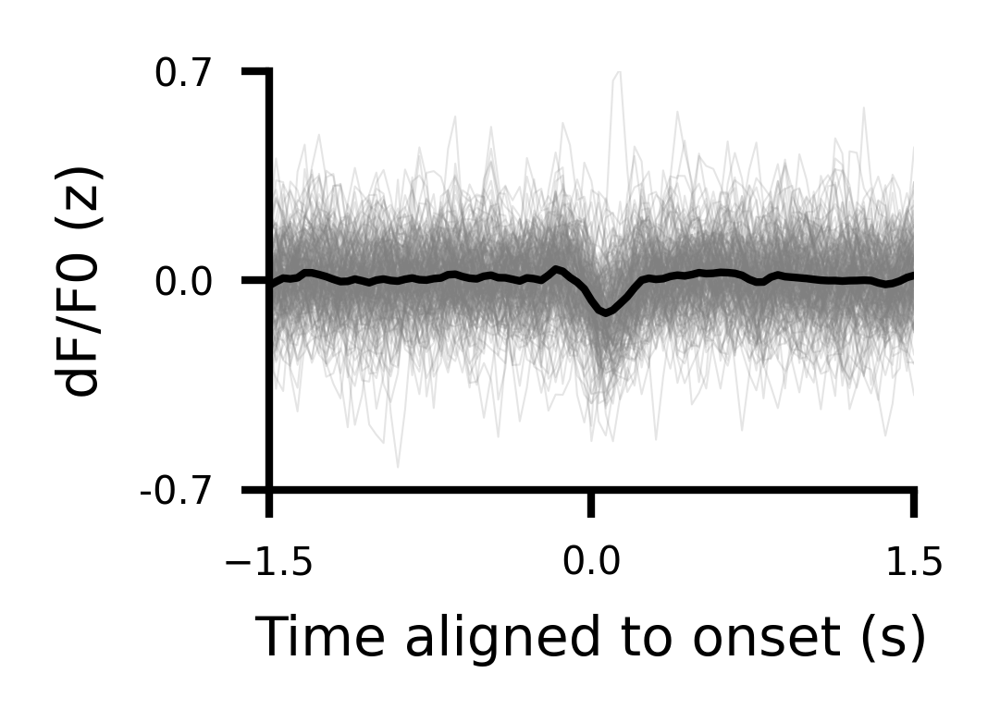

In [37]:
for k, v in waveforms.items():
    fig = fg(1.5, 1)
    fig.dpi = 300
    ax = fig.gca()
    ax.plot(time, np.array(v).T, lw=0.25, c="gray", alpha=0.2)
    ax.plot(time, np.nanmean(v, axis=0), lw=1, c="k")
    ax.set(
        xlim=time_window,
        xlabel="Time aligned to onset (s)",
        ylabel="dF/F0 (z)",
        xticks=(time_window[0], 0, time_window[1]),
        ylim=(-0.7, 0.7),
    )
    clean_ticks(ax, axis="y", zero_symmetry=False)
    sns.despine()
    saver(fig, f"filtered-syllable-callout-{k}-per-session");

## Try making a distance matrix

In [412]:
dist_mtx = squareform(pdist(everything[:, (time > -0.5) & (time < 0.5)] , metric='correlation'))

In [413]:
dist_mtx.shape

(12149, 12149)

In [414]:
dist_mtx[np.diag_indices_from(dist_mtx)] = np.nan

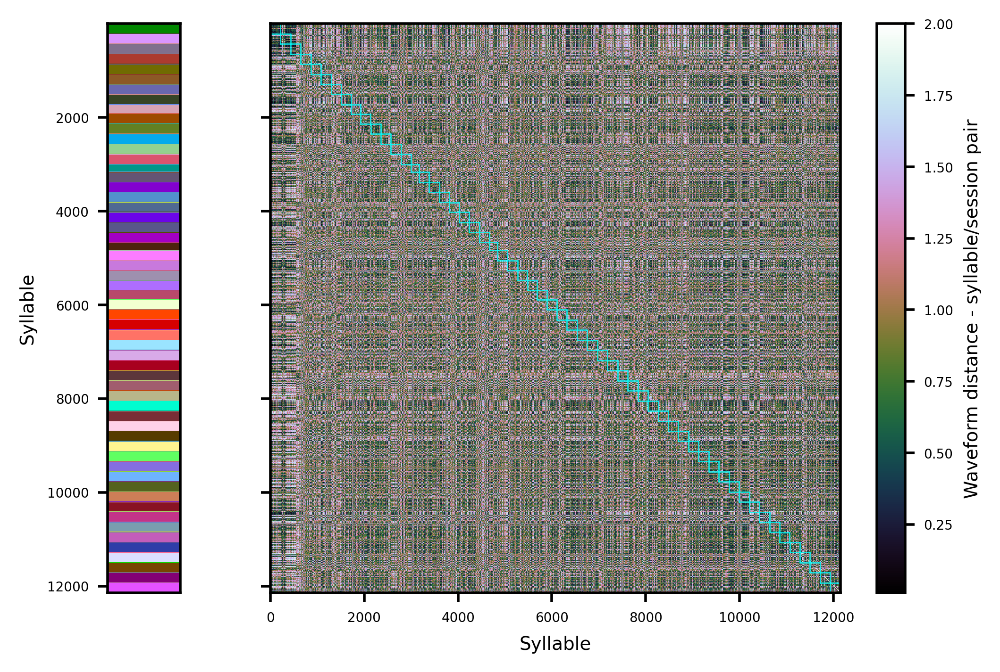

In [415]:
fig, ax_dict = plt.subplot_mosaic('AB', figsize=(6, 4), sharey=True, gridspec_kw=dict(width_ratios=[1, 10]))
fig.dpi = 200
line_kws = dict(lw=0.5, c='cyan', alpha=0.8)
im = ax_dict['B'].imshow(dist_mtx, cmap='cubehelix', interpolation='none', vmax=2)
for s in sylls.index:
    inds = np.where(syll_labels == s)[0]
    lo, hi = inds.min(), inds.max()
    ax_dict['B'].plot([lo, lo], [lo, hi], **line_kws)
    ax_dict['B'].plot([lo, hi], [lo, lo], **line_kws)
    ax_dict['B'].plot([hi, hi], [lo, hi], **line_kws)
    ax_dict['B'].plot([lo, hi], [hi, hi], **line_kws)
ax_dict['A'].imshow(syll_labels[:, None], aspect='auto', cmap=cc.cm.glasbey, extent=(0, 1, len(everything) - 0.5, 0.5))
ax_dict['A'].set(xticks=[], ylabel='Syllable')
ax_dict['B'].set(xlabel='Syllable')
fig.colorbar(im, ax=ax_dict['B'], label='Waveform distance - syllable/session pair')
saver(fig, 'syllable-session-waveform-distance-mtx');

## Try distance matrix on syllables (sorted by hierarchical clustering)

In [419]:
waveforms = defaultdict(list)

for k, _df in tqdm(df.groupby('mouse_id')):
    for syll in sorting:
        inds = np.where((_df['predicted_syllable (offline)'] == syll) & _df['offline onset'])[0]
        if len(inds) > 0:
            time, mtx = window_trials_as_mtx(_df, inds, 'signal_reref_dff_z', truncation_window=(-3, 3))
            waveforms[syll].append(pd.Series(np.nanmean(mtx, axis=0)).interpolate(limit_direction='both').to_numpy())
waveforms = dict(waveforms)

  0%|          | 0/14 [00:00<?, ?it/s]

In [423]:
wf = np.array(list(valmap(lambda v: np.nanmean(v, axis=0), waveforms).values()))

In [426]:
dist_mtx = squareform(pdist(wf[:, (time > -0.5) & (time < 0.5)] , metric='correlation'))

In [427]:
dist_mtx.shape

(57, 57)

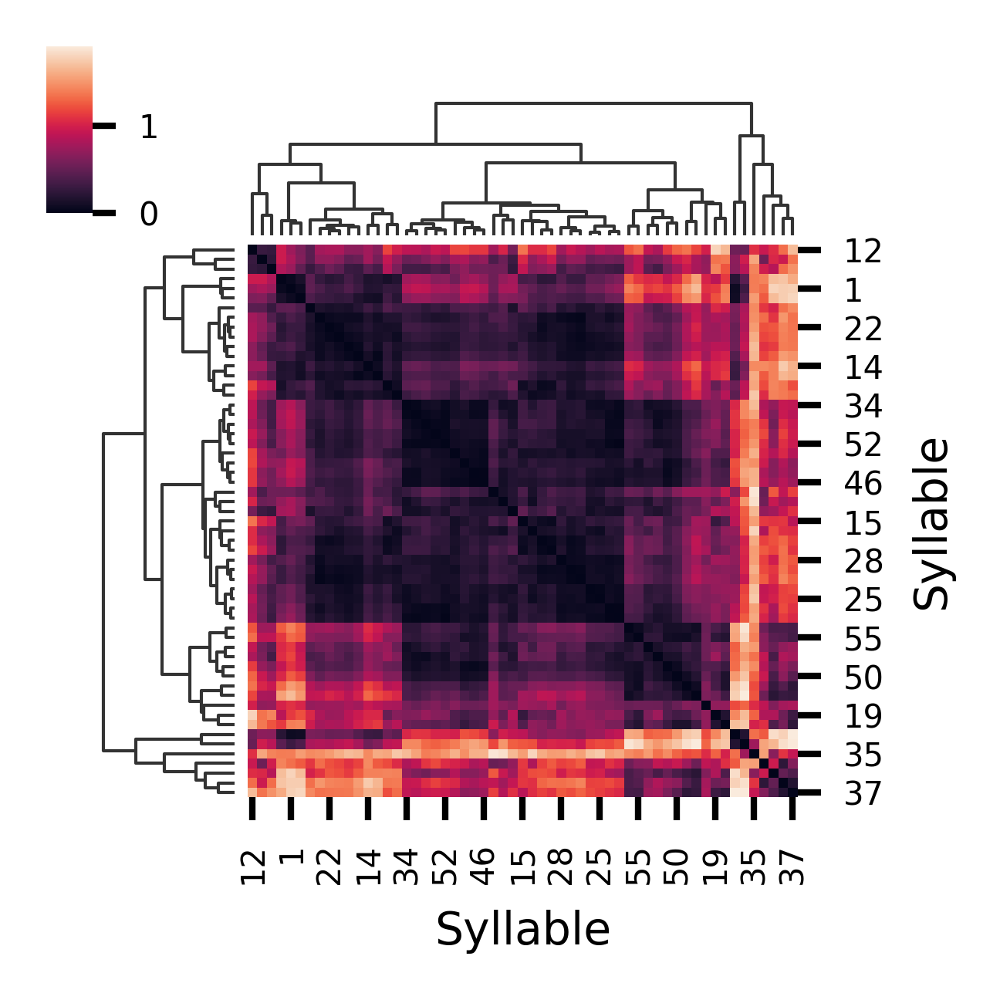

In [435]:
g = sns.clustermap(dist_mtx, method='complete', figsize=(2, 2), )
g.ax_heatmap.set(xlabel='Syllable', ylabel='Syllable')
g.fig.dpi = 300

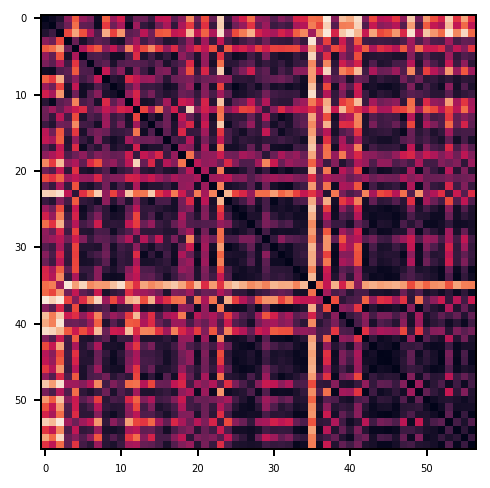

In [440]:
plt.imshow(dist_mtx)

In [414]:
# dist_mtx[np.diag_indices_from(dist_mtx)] = np.nan

## Try UMAPing the waveforms

In [208]:
import umap

In [225]:
reducer = umap.UMAP(metric='euclidean', n_neighbors=50)

In [226]:
fit = reducer.fit_transform(everything[:, (time > -0.5) & (time < 0.5)]) 

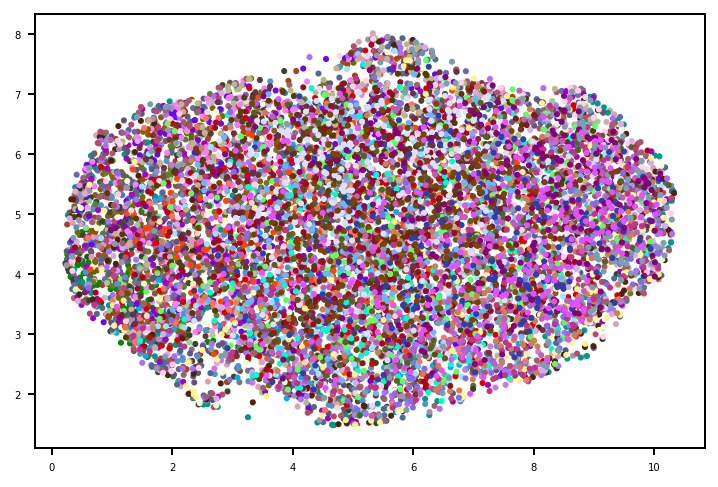

In [227]:
plt.scatter(fit[:, 0], fit[:, 1], c=syll_labels, cmap=cc.cm.glasbey, s=5)

## For each syllable, plot within-mouse variability against between mouse variability

In [26]:
from toolz import compose, curry

In [27]:
def shuff_and_select(v):
    np.random.shuffle(v)
    return np.nanmean(v[:len(v)//2], axis=0)

In [28]:
windowed_trials = {}
for (mouse, uuid), _df in tqdm(df.groupby(['mouse_id', 'uuid'], sort=False)):
    for syllable in sorting:
        time, mtx = window_trials_as_mtx(_df, np.where(_df['offline onset'] & (_df['predicted_syllable (offline)'] == syllable))[0], 'signal_reref_dff_z', truncation_window=(-3, 3))
        windowed_trials[(mouse, uuid, syllable)] = mtx

  0%|          | 0/216 [00:00<?, ?it/s]

In [29]:
shuffler = compose(np.array, list, lambda d: d.values(), curry(valmap)(shuff_and_select))

In [30]:
boots = 100

In [32]:
# compute between session within mouse syllable distance after bootstrapping
btw_session_var = []

for mouse, _df in tqdm(df.groupby('mouse_id', sort=False, observed=True)):
    for syll in sorting:
        session_mtx = keyfilter(lambda k: mouse in k and syll in k, windowed_trials)
        boot_vals = defaultdict(list)
        for i in range(boots):
            _d = pdist(shuffler(session_mtx), metric='correlation')
            boot_vals['mean'].append(np.nanmean(_d))
            boot_vals['median'].append(np.nanmedian(_d))
        btw_session_var.append(dict(
            mouse=mouse,
            syllable=syll,
            mean_dist=np.nanmean(boot_vals['mean']),
            median_dist=np.nanmean(boot_vals['median']),
        ))
btw_session_var = pd.DataFrame(btw_session_var)
btw_session_var.head()

  0%|          | 0/14 [00:00<?, ?it/s]

,mouse,syllable,mean_dist,median_dist
0,dls-dlight-1,5,0.864648,0.861014
1,dls-dlight-1,27,0.712566,0.702325
2,dls-dlight-1,41,0.960869,0.960401
3,dls-dlight-1,66,0.980545,0.981880
4,dls-dlight-1,86,0.929443,0.925446


In [34]:
between_mouse_var = []
for mouse, _df in tqdm(df.groupby('mouse_id', sort=False, observed=True)):
    for syll in sorting:
        mouse_mtx = keyfilter(lambda k: mouse in k and syll in k, windowed_trials)
        other_mtx = keyfilter(lambda k: mouse not in k and syll in k, windowed_trials)
        boot_vals = defaultdict(list)
        for i in range(boots):
            _d = cdist(shuffler(mouse_mtx), shuffler(other_mtx), metric='correlation')
            boot_vals['mean'].append(np.nanmean(_d))
            boot_vals['median'].append(np.nanmedian(_d))
        between_mouse_var.append(dict(
            mouse=mouse,
            syllable=syll,
            mean_dist=np.nanmean(boot_vals['mean']),
            median_dist=np.nanmean(boot_vals['median']),
        ))
between_mouse_var = pd.DataFrame(between_mouse_var)
between_mouse_var.head()

  0%|          | 0/14 [00:00<?, ?it/s]

,mouse,syllable,mean_dist,median_dist
0,dls-dlight-1,5,0.847627,0.842493
1,dls-dlight-1,27,0.895660,0.886185
2,dls-dlight-1,41,0.976769,0.977240
3,dls-dlight-1,66,0.972790,0.972303
4,dls-dlight-1,86,0.946666,0.944715


In [ ]:
# compute between syllables but within mouse
between_syllable_var = []
for mouse, _df in tqdm(df.groupby('mouse_id', sort=False, observed=True)):
    for syll in sorting:
        syll_mtx = keyfilter(lambda k: mouse in k and syll in k, windowed_trials)
        other_mtx = keyfilter(lambda k: mouse in k and syll not in k, windowed_trials)
        boot_vals = defaultdict(list)
        for i in range(boots):
            mtx1 = shuffler(syll_mtx)
            mtx2 = shuffler(other_mtx)
            _d = cdist(mtx1, mtx2, metric='correlation')
            boot_vals['mean'].append(np.nanmean(_d))
            boot_vals['median'].append(np.nanmedian(_d))
        between_syllable_var.append(dict(
            mouse=mouse,
            syllable=syll,
            mean_dist=np.nanmean(boot_vals['mean']),
            median_dist=np.nanmean(boot_vals['median']),
        ))
between_syllable_var = pd.DataFrame(between_syllable_var)
between_syllable_var.head()

  0%|          | 0/14 [00:00<?, ?it/s]

In [ ]:
# compute within session within syllable distance
within_session_var = []

for k, _df in tqdm(df.groupby(['mouse_id', 'uuid'], sort=False, observed=True)):
    for syll in sorting:
        session_mtx = windowed_trials[(*k, syll)].copy()
        boot_vals = []
        for i in range(boots):
            np.random.shuffle(session_mtx)
            _d = cdist([np.nanmean(session_mtx[:len(session_mtx)//2], axis=0)], [np.nanmean(session_mtx[len(session_mtx)//2:], axis=0)], metric='correlation')
            boot_vals.append(_d.flat[0])
        within_session_var.append(dict(
            mouse=k[0],
            syllable=syll,
            mean_dist=np.nanmean(boot_vals),
            median_dist=np.nanmedian(boot_vals),
        ))
within_session_var = pd.DataFrame(within_session_var)

# average for each mouse and syllable
within_session_var = within_session_var.groupby(['mouse', 'syllable']).mean().reset_index()
within_session_var.head()

In [ ]:
new_var = btw_session_var.merge(between_mouse_var, on=['mouse', 'syllable'], suffixes=('_within', '_between'))
new_var = new_var.merge(between_syllable_var, on=['mouse', 'syllable']).rename(columns={'mean_dist': 'mean_dist_between_syllable', 'median_dist': 'median_dist_between_syllable'})
new_var = new_var.merge(within_session_var, on=['mouse', 'syllable']).rename(columns={'mean_dist': 'mean_dist_within_session', 'median_dist': 'median_dist_within_session'})

In [ ]:
new_var.head()

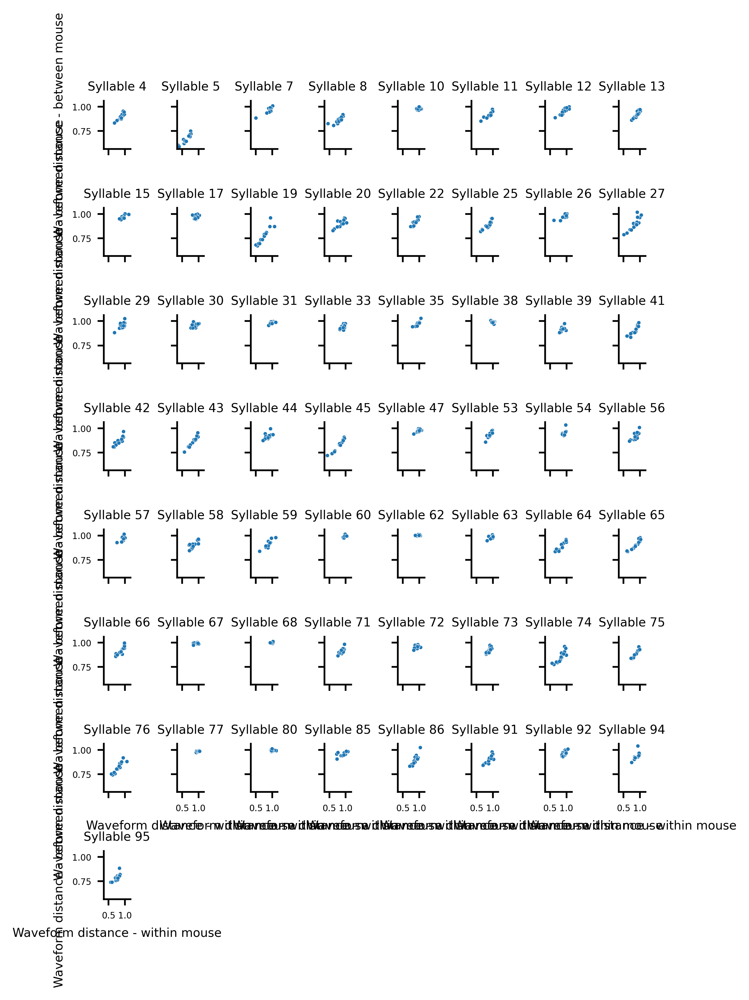

In [416]:
g = sns.FacetGrid(data=new_var, col='syllable', col_wrap=8, height=0.9, aspect=0.7)
g.fig.dpi = 200
g.map(sns.scatterplot, 'median_dist_within', 'median_dist_between', s=5, lw=0)
g.set_titles(template="Syllable {col_name}", size=7)
# g.map(ident)

g.set_ylabels('Waveform distance - between mouse')
g.set_xlabels('Waveform distance - within mouse')
saver(g.fig, 'syllable-facet-within-vs-between-variability');

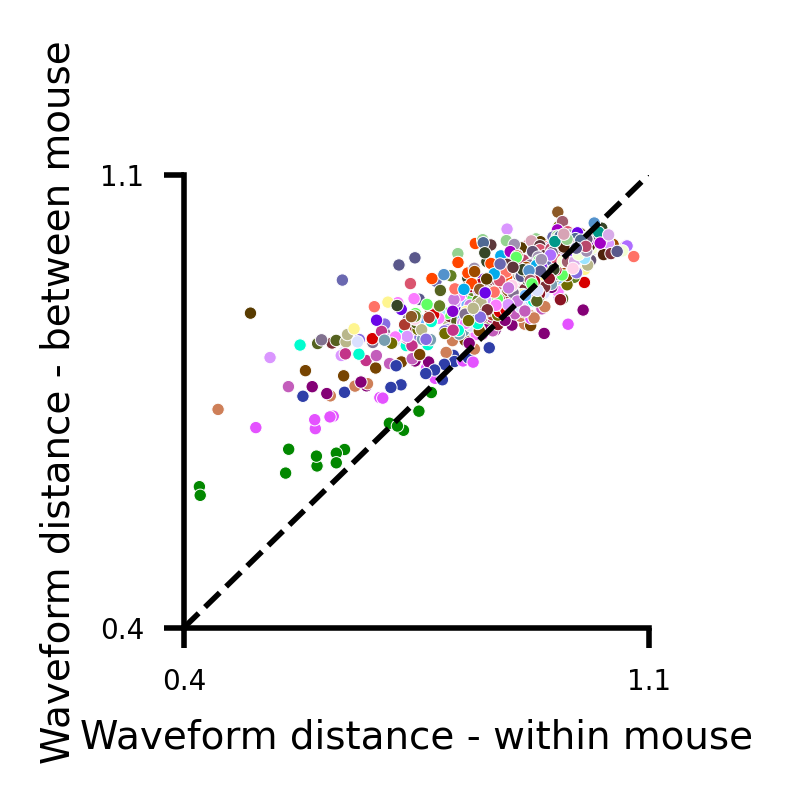

In [371]:
fig = fg(1.5, 1.5)
fig.dpi = 200
ax = sns.scatterplot(data=new_var, x='mean_dist_within', y='mean_dist_between', hue='syllable', palette=cc.cm.glasbey, s=5, legend=False, lw=0)
add_identity(ax, c='k', linestyle='--')
ax.set(ylim=(0.4, 1.1), xlim=(0.4, 1.1), xlabel='Waveform distance - within mouse', ylabel='Waveform distance - between mouse')
clean_ticks(ax, zero_symmetry=False, include_zero=False, precision=1)
clean_ticks(ax, axis='y', zero_symmetry=False, include_zero=False, precision=1)
sns.despine()
saver(fig, 'within-vs-between-variability');

In [50]:
new_var.to_parquet('/home/wg41/reinforcement_data/processed-dfs/variability-within-between-mice-and-syllables.parquet')

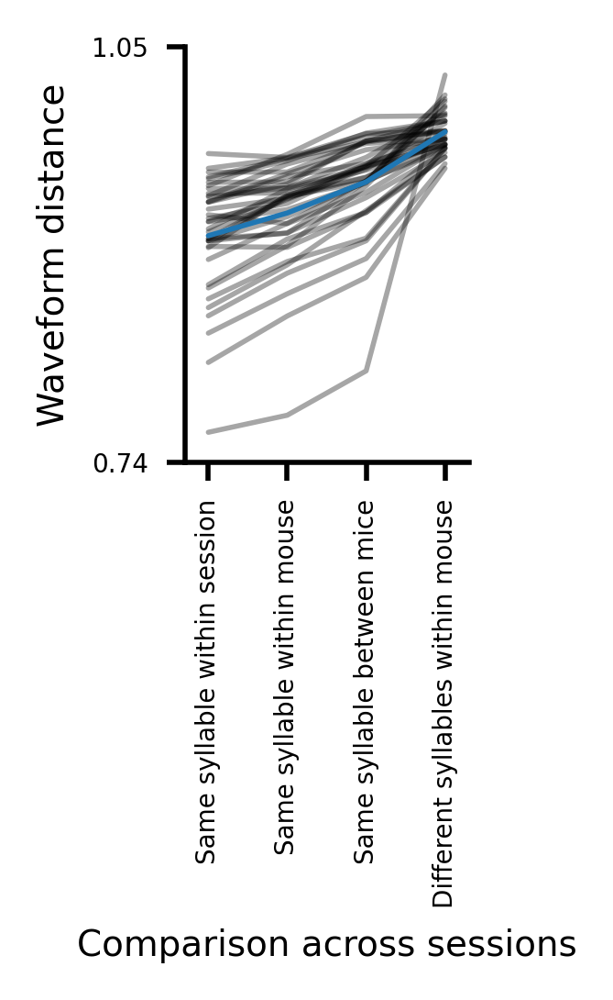

In [49]:
fig = fg(1, 1.5)
fig.dpi = 200
ax = fig.gca()
x = [0, 1, 2, 3]
# x = [0, 1, 2]
for idx, row in new_var.groupby("syllable").mean().iterrows():
    ax.plot(
        x,
        row[["mean_dist_within_session", "mean_dist_within", "mean_dist_between", "mean_dist_between_syllable"]],
        c="k",
        lw=1,
        alpha=0.35,
        zorder=-1
    )
    # ax.plot(
    #     x,
    #     row[["mean_dist_within_session", "mean_dist_within", "mean_dist_between", "mean_dist_between_syllable"]],
    #     marker="o",
    #     ls="",
    #     c="k",
    #     mfc="#f4f4f4",
    #     mew=0.5,
    #     ms=3,
    #     zorder=2
    # )
new_var[["mean_dist_within_session", "mean_dist_within", "mean_dist_between", "mean_dist_between_syllable"]].mean().plot()
pad = 0.3
ax.set(
    xlim=(-pad, max(x) + pad),
    xticks=x,
    xticklabels=[
        "Same syllable within session",
        "Same syllable within mouse",
        "Same syllable between mice",
        "Different syllables within mouse",
    ],
    xlabel="Comparison across sessions",
    ylabel="Waveform distance",
    # ylim=(0, None),
    # ylim=(0.9, 1.05),
)
plt.xticks(rotation=90)
clean_ticks(ax, axis="y", include_zero=False, precision=2)
sns.despine()
# saver(fig, 'waveform-distance-comparing-syllables');

# RAW dF/F0

## Show distribution of raw dF/F peak values within syllable

In [28]:
agg_df, trial_df = window_trials_pro(
    df,
    np.where(df["offline onset"])[0],
    "signal_reref_dff",
    agg_window=(0, 0.3),
    avg_window=(0, 0.3),
    zscore_signal=False,
)

In [27]:
agg_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 615027 entries, 0 to 689147
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   mu            615027 non-null  float64
 1   std           615027 non-null  float64
 2   max           615027 non-null  float64
 3   min           615027 non-null  float64
 4   robust_range  614969 non-null  float64
 5   range         614969 non-null  float64
 6   slope         614986 non-null  float64
 7   labels        615027 non-null  float64
 8   trial_index   615027 non-null  int64  
dtypes: float64(8), int64(1)
memory usage: 46.9 MB


In [26]:
agg_df['max'].quantile(0.999)

0.09439824348929443

In [29]:
agg_df = agg_df[agg_df['max'] < 0.15]

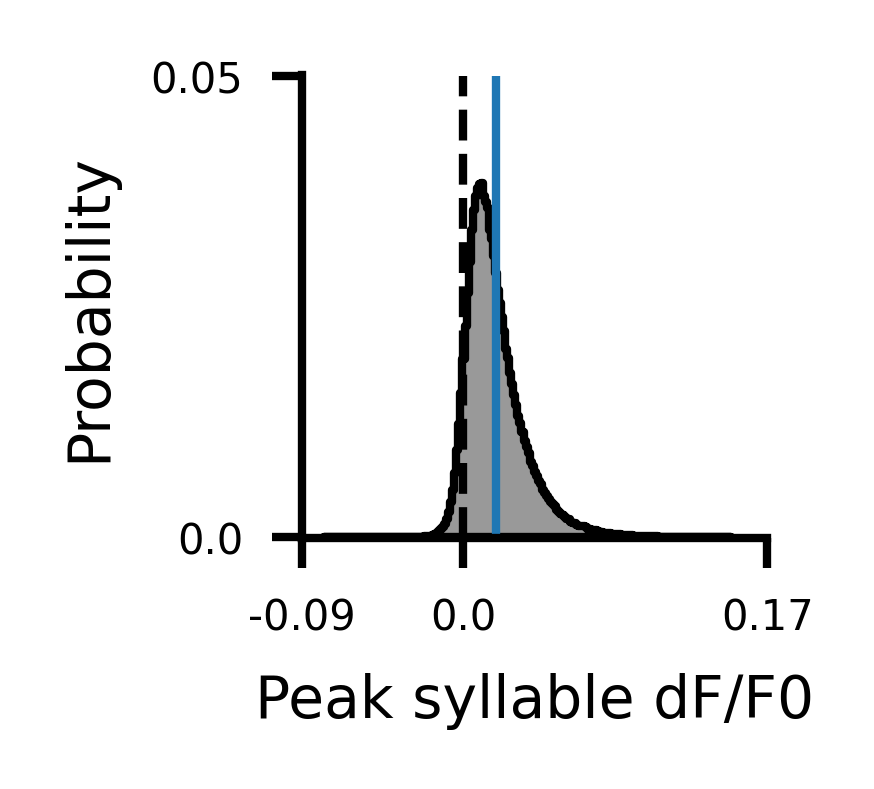

In [41]:
fig = fg(1, 1)
fig.dpi = 300
ax = sns.histplot(agg_df['max'], color='k', element='step', fill=True, bins=200, stat='probability', alpha=0.4, lw=1)
ax.set(xlabel="Peak syllable dF/F0")
ax.axvline(agg_df['max'].mean(), color='C0', lw=1)
clean_ticks(ax, "x", zero_symmetry=False, precision=2)
clean_ticks(ax, "y", zero_symmetry=False, precision=2)
ax.axvline(0, lw=1, c='k', ls='--')
sns.despine()
saver(fig, 'raw-peak-syllable-dff-distribution');

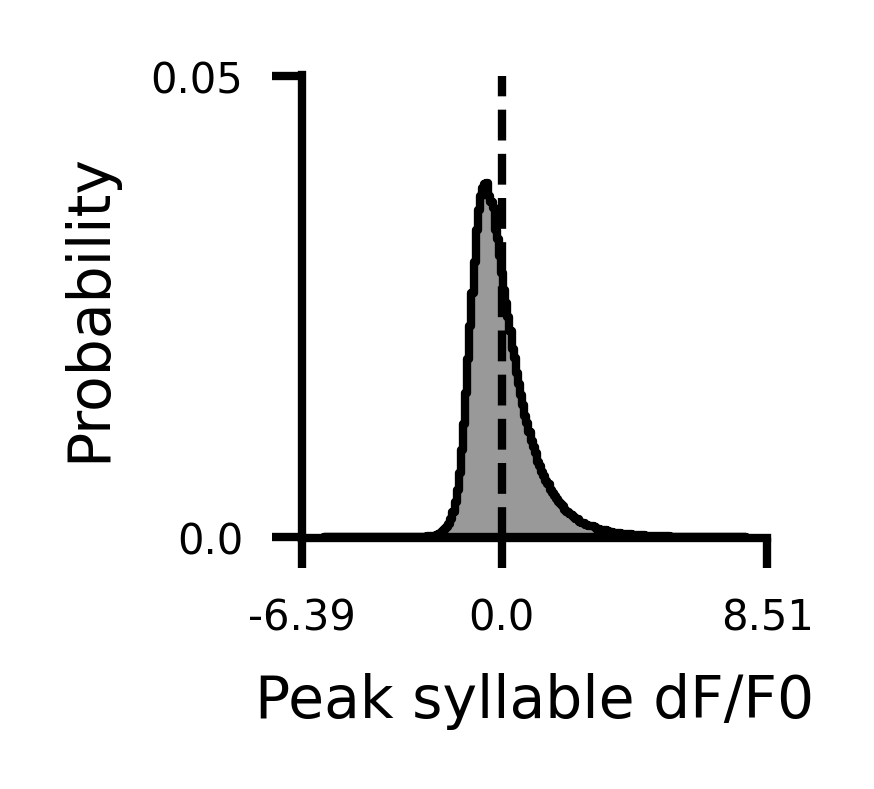

In [44]:
fig = fg(1, 1)
fig.dpi = 300
ax = sns.histplot(zscore(agg_df['max']), color='k', element='step', fill=True, bins=200, stat='probability', alpha=0.4, lw=1)
ax.set(xlabel="Peak syllable dF/F0")
clean_ticks(ax, "x", zero_symmetry=False, precision=2)
clean_ticks(ax, "y", zero_symmetry=False, precision=2)
ax.axvline(0, lw=1, c='k', ls='--')
sns.despine()
saver(fig, 'zscored-v2-peak-syllable-dff-distribution');

In [19]:
(agg_df['max'] < 0).mean()

0.06485932034454292

In [32]:
1 - (agg_df['max'] < 0).mean()

0.9351406796554571

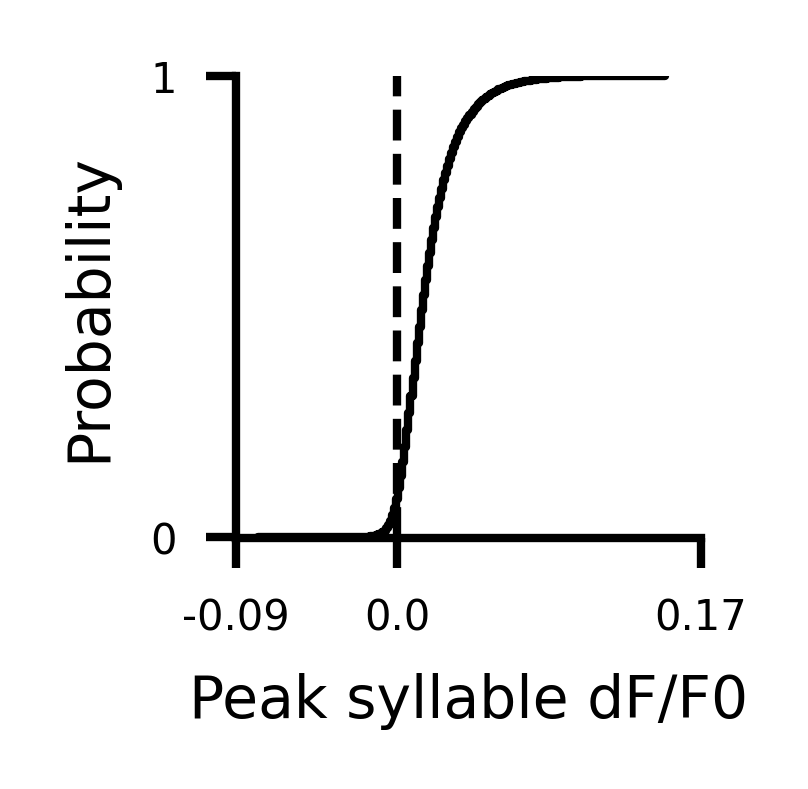

In [37]:
fig = fg(1, 1)
fig.dpi = 300
ax = sns.histplot(
    agg_df["max"], color="k", element="step", fill=False, bins=200, stat="probability", cumulative=True
)
ax.set(xlabel="Peak syllable dF/F0", ylim=(0, 1))
clean_ticks(ax, "x", zero_symmetry=False, precision=2)
clean_ticks(ax, "y", zero_symmetry=False, dtype=int)
ax.axvline(0, lw=1, c='k', ls='--')
sns.despine()
saver(fig, 'raw-peak-syllable-dff-cumulative-distribution');

## Show distribution of z-scored dF/F peak values within syllable

In [32]:
feat_df['signal_dff_z_max'].quantile(0.999)

5.139721

In [33]:
tmp_feat_df = feat_df[feat_df['signal_dff_z_max'] < 7]

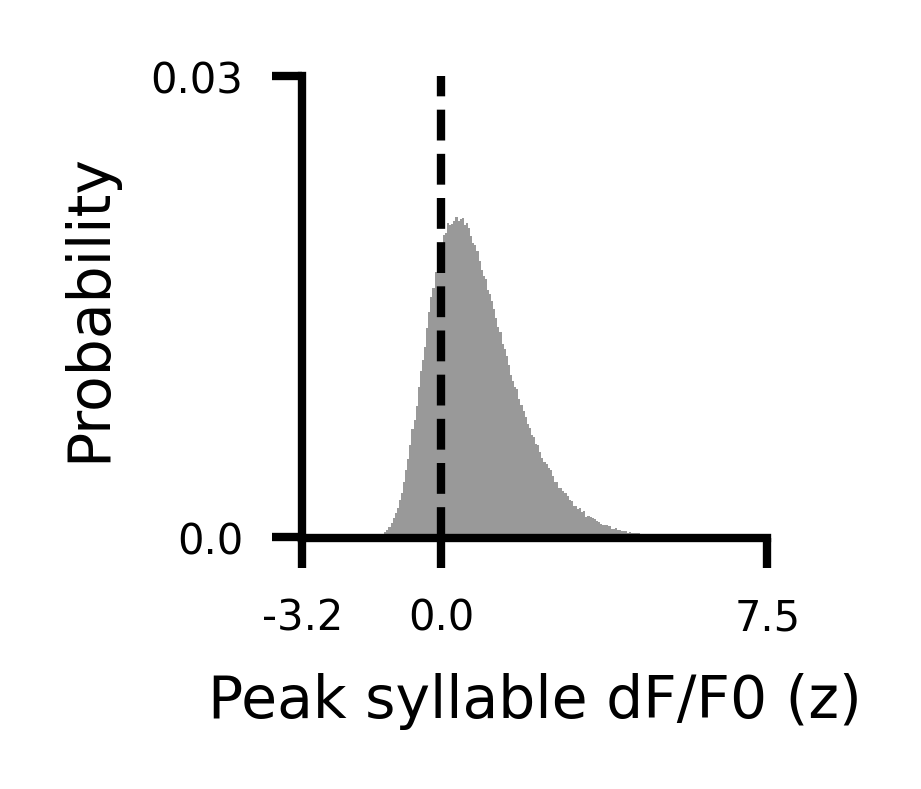

In [38]:
fig = fg(1, 1)
fig.dpi = 300
ax = sns.histplot(tmp_feat_df['signal_dff_z_max'], color='k', element='step', fill=True, bins=200, stat='probability', alpha=0.4, lw=0)
ax.set(xlabel="Peak syllable dF/F0 (z)")
clean_ticks(ax, "x", zero_symmetry=False, precision=1)
clean_ticks(ax, "y", zero_symmetry=False, precision=2)
ax.axvline(0, lw=1, c='k', ls='--')
sns.despine()
saver(fig, 'z-scored-peak-syllable-dff-distribution');

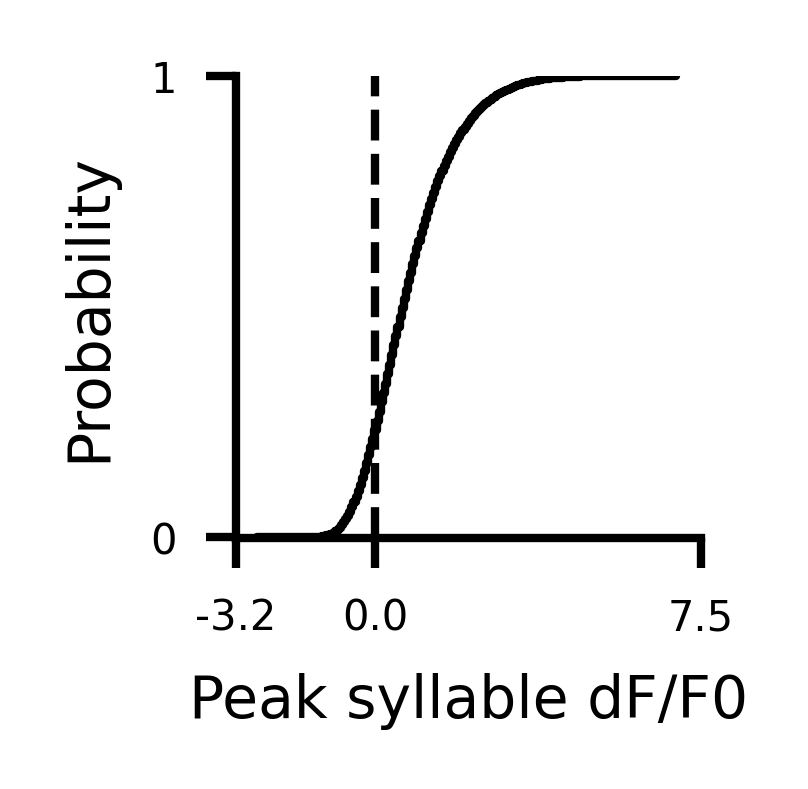

In [39]:
fig = fg(1, 1)
fig.dpi = 300
ax = sns.histplot(
    tmp_feat_df['signal_dff_z_max'], color="k", element="step", fill=False, bins=200, stat="probability", cumulative=True
)
ax.set(xlabel="Peak syllable dF/F0", ylim=(0, 1))
clean_ticks(ax, "x", zero_symmetry=False, precision=1)
clean_ticks(ax, "y", zero_symmetry=False, dtype=int)
ax.axvline(0, lw=1, c='k', ls='--')
sns.despine()
saver(fig, 'z-scored-peak-syllable-dff-cumulative-distribution');

## Large syllable-by-session waveform plot, but raw df/f0

In [106]:
waveforms = defaultdict(list)
peaks = defaultdict(list)

for k, _df in tqdm(df.groupby(["mouse_id", "uuid"], sort=False, observed=True)):
    feat_session = feat_df[feat_df["uuid"] == k[1]]
    for syll in sorting:
        inds = np.where((_df["predicted_syllable (offline)"] == syll) & _df["offline onset"])[0]
        if len(inds) > 0:
            agg_df, trial_df = window_trials_pro(
                _df,
                inds,
                "signal_reref_dff",
                agg_window=(0, 0.3),
                zscore_signal=False,
                avg_window=(0, 0.3),
                truncation_window=(-3, 3),
            )
            waveforms[syll].append(trial_df.groupby("time")["dlight"].mean().to_numpy() - trial_df['dlight'].median())
            # grab avg peak DA
            _avg_peak_da = agg_df["max"].mean()
            peaks[syll].append(_avg_peak_da)
waveforms = dict(waveforms)
peaks = dict(peaks)

  0%|          | 0/216 [00:00<?, ?it/s]

In [107]:
all_peaks = np.concatenate([peaks[k] for k in sorting])

everything = np.concatenate([waveforms[k] for k in sorting], axis=0)
mask = np.all(np.isnan(everything), axis=1)

syll_labels = []
for k in sorting:
    syll_labels.extend(np.repeat([k], len(waveforms[k])))
syll_labels = np.array(syll_labels)

everything = everything[~mask]
syll_labels = syll_labels[~mask]
all_peaks = all_peaks[~mask]

cumulative = pd.Series(syll_labels).value_counts().reindex(sorting)
boundaries = cumulative.cumsum()

In [108]:
np.linspace(0, len(syll_labels), len(sorting), dtype=int)

array([   0,  221,  443,  665,  887, 1109, 1331, 1553, 1775, 1997, 2219,
       2441, 2663, 2885, 3107, 3329, 3551, 3773, 3995, 4217, 4439, 4661,
       4883, 5105, 5327, 5549, 5771, 5993, 6215, 6437, 6659, 6881, 7103,
       7325, 7547, 7769, 7991])

In [109]:
sylls, counts = np.unique(syll_labels, return_counts=True)

In [110]:
mid = np.mean(everything)
mid = 0

In [111]:
offset = counts[0] // 2

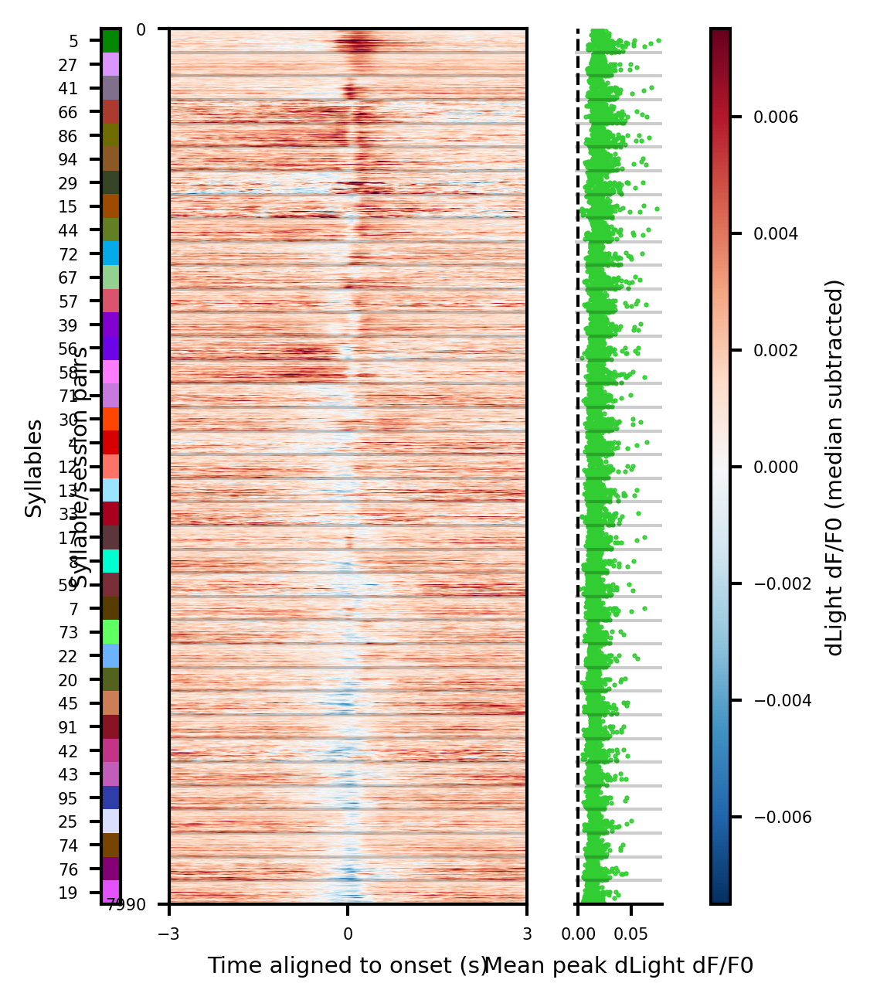

In [113]:
# fig, ax = subplots(1, 2, 1.3, 1, gridspec_kws={})
fig, ax_dict = plt.subplot_mosaic(
    "ABBBBBBCCD",
    figsize=(3.5, 5),
)
fig.dpi = 150
ax_dict["A"].imshow(
    syll_labels[:, None],
    aspect="auto",
    cmap=cc.cm.glasbey,
    extent=(0, 1, len(everything) - 0.5, 0.5),
    interpolation="none",
)
ax_dict["A"].set(xticks=[], ylabel="Syllables", yticks=np.linspace(offset, len(syll_labels) - offset, len(sorting)), yticklabels=sorting)
im = ax_dict["B"].imshow(
    everything,
    aspect="auto",
    cmap="RdBu_r",
    vmin=mid - 0.0075,
    vmax=mid + 0.0075,
    extent=(time[0], time[-1], len(everything), 0),
)
ax_dict["B"].set(
    xlabel="Time aligned to onset (s)",
    ylabel="Syllable/session pairs",
    yticks=[0.5, len(everything) - 0.5],
    xticks=[-3, 0, 3],
)
for _, v in boundaries.iteritems():
    ax_dict["B"].axhline(v, lw=1, ls='-', c='k', alpha=0.2)
ax_dict["C"].plot(all_peaks, np.arange(len(all_peaks)), '.', c="limegreen", ms=1)
ax_dict["C"].axvline(0, lw=1, ls="--", c="k")
ax_dict["C"].set(ylim=(0, len(all_peaks) - 1), yticks=[], xlabel="Mean peak dLight dF/F0")
ax_dict["C"].invert_yaxis()
for _, v in boundaries.iteritems():
    ax_dict["C"].axhline(v, lw=1, ls='-', c='k', alpha=0.2)
# clean_ticks(ax_dict['C'], zero_symmetry=False, precision=1)
sns.despine(ax=ax_dict["C"], left=True)

cb = fig.colorbar(im, cax=ax_dict["D"], label="dLight dF/F0 (median subtracted)", aspect=60)
plt.subplots_adjust(wspace=2.5)

saver(fig, "avg-raw-dlight-waveforms-for-all-syllables-and-sessions-median-subt");

## Same syllable-aligned wavefor plots as above, but with raw dF/F0

In [100]:
mouse_data = {}
for mouse, mouse_df in tqdm(df.groupby("mouse_id", observed=True)):
    inds = np.where(mouse_df["offline onset"])[0]
    time, trials = window_trials_as_mtx(
        mouse_df, inds, "signal_reref_dff", zscore_signal=False, truncation_window=(-3, 3)
    )
    mouse_data[mouse] = trials

  0%|          | 0/14 [00:00<?, ?it/s]

In [101]:
time, total_trials = window_trials_as_mtx(
    df,
    np.where(df["offline onset"])[0],
    "signal_reref_dff",
    zscore_signal=False,
    truncation_window=(-3, 3),
)

In [102]:
means = valmap(lambda v: np.nanmean(v, axis=0) - np.nanmedian(v), mouse_data)

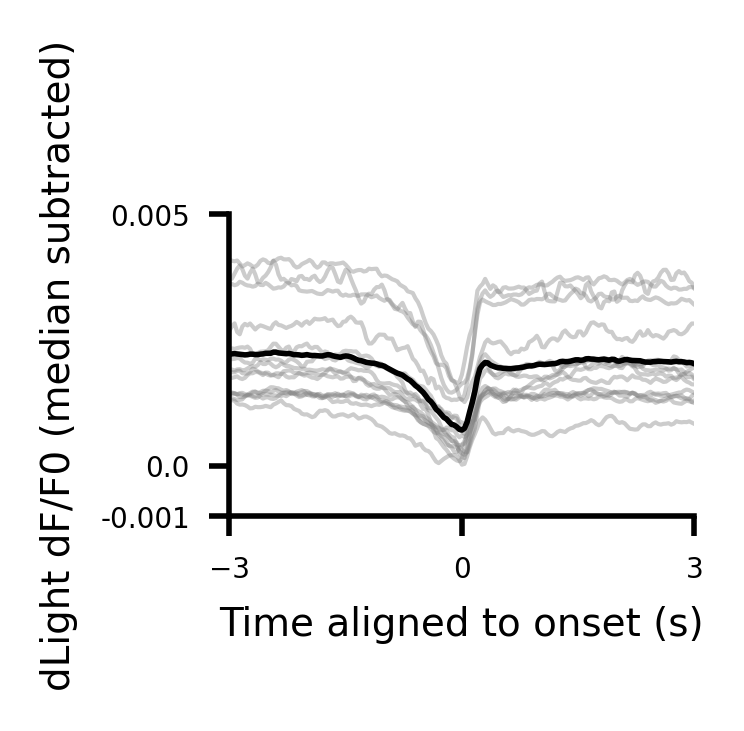

In [105]:
fig = fg(1.5, 1)
fig.dpi = 200
ax = fig.gca()
for k, v in means.items():
    ax.plot(time, v, lw=0.75, c="gray", alpha=0.4)
ax.plot(time, np.nanmean(list(means.values()), axis=0), lw=1, c="k")
ax.set(
    xlim=(-3, 3),
    xlabel="Time aligned to onset (s)",
    ylabel="dLight dF/F0 (median subtracted)",
    xticks=(-3, 0, 3),
    # ylim=(-0.19, 0.09),
)
clean_ticks(ax, axis="y", zero_symmetry=False, precision=3)
sns.despine()
saver(fig, "raw-dff-grand-average-per-mouse-median-subt");

## Try plotting grand average waveforms per session

In [86]:
session_data = defaultdict(list)
for (mouse, uuid), mouse_df in tqdm(df.groupby(["mouse_id", "uuid"], observed=True)):
    inds = np.where(mouse_df["offline onset"])[0]
    time, trials = window_trials_as_mtx(
        mouse_df, inds, "signal_reref_dff", zscore_signal=False, truncation_window=(-3, 3)
    )
    session_data[mouse].append(np.nanmean(trials, axis=0) - np.nanmedian(trials))

  0%|          | 0/216 [00:00<?, ?it/s]

In [87]:
mouse_boundaries = valmap(len, session_data)

In [88]:
# means = valmap(lambda v: [np.nanmean(i, axis=0) for i in v], session_data)
means = np.concatenate(list(session_data.values()))

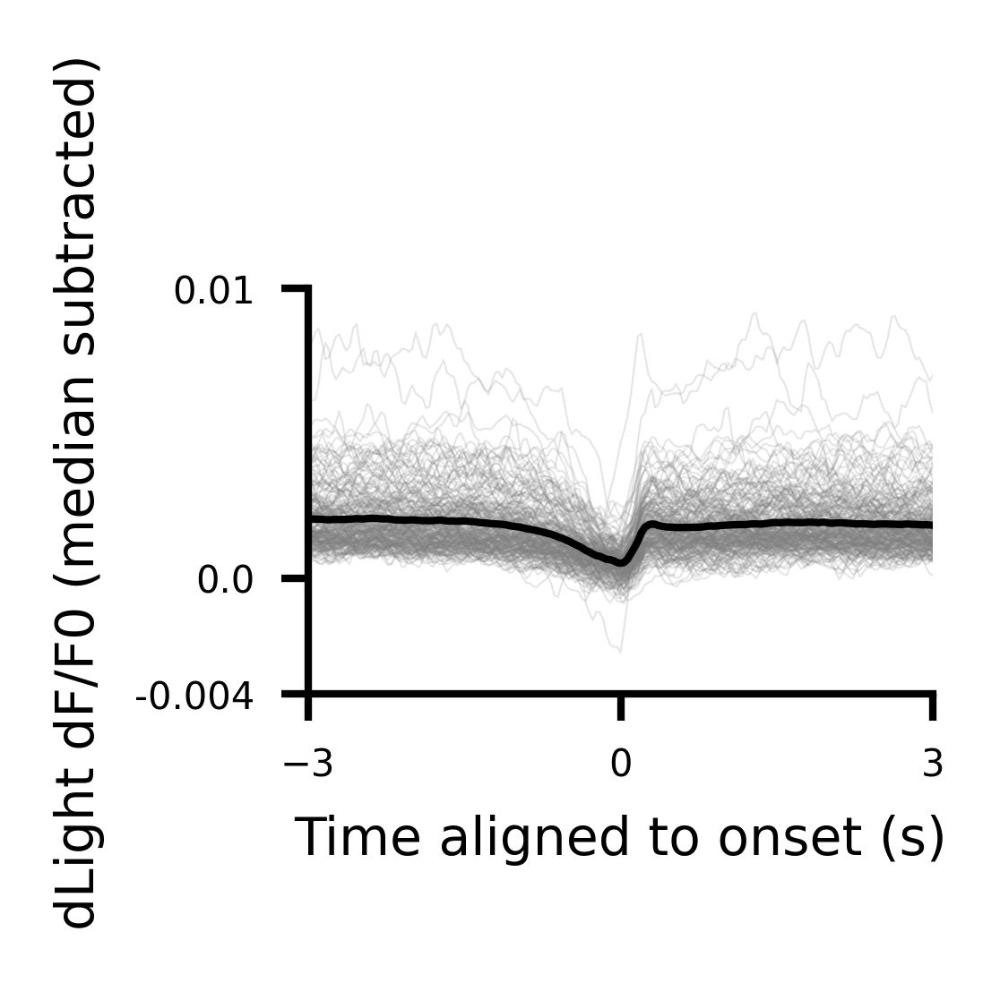

In [93]:
fig = fg(1.5, 1)
fig.dpi = 300
ax = fig.gca()
ax.plot(time, means.T, lw=0.25, c="gray", alpha=0.2)
ax.plot(time, np.nanmean(means, axis=0), lw=1, c="k")
ax.set(
    xlim=(-3, 3),
    xlabel="Time aligned to onset (s)",
    ylabel="dLight dF/F0 (median subtracted)",
    xticks=(-3, 0, 3),
    # ylim=(-0.19, 0.09),
)
clean_ticks(ax, axis="y", zero_symmetry=False, precision=3)
sns.despine()
saver(fig, "raw-dff-grand-average-per-session-median-subt");

In [97]:
mid = np.mean(means)
mid = 0

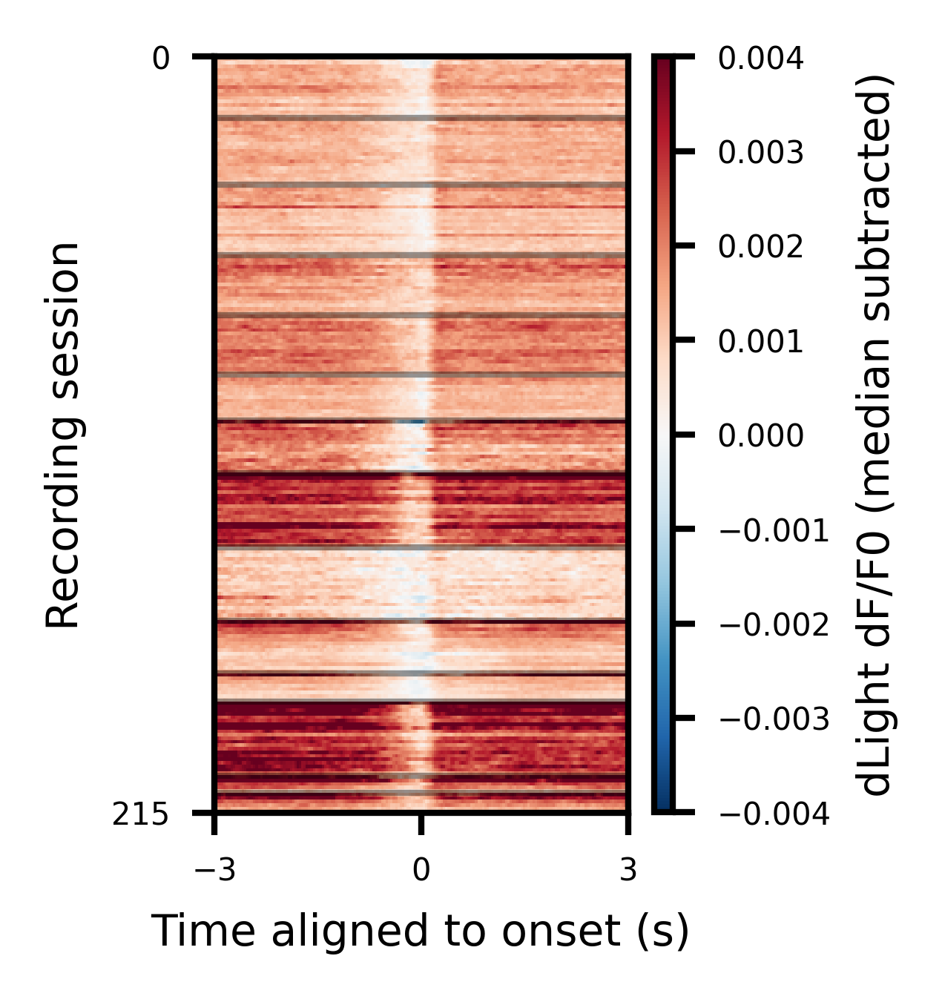

In [99]:
fig = fg(1.5, 2.25)
fig.dpi = 300
ax = fig.gca()
im = ax.imshow(
    means,
    cmap="RdBu_r",
    vmin=mid - 0.004,
    vmax=mid + 0.004,
    aspect="auto",
    extent=(time[0], time[-1], len(means), 0),
)
for v in np.cumsum(list(mouse_boundaries.values())):
    ax.axhline(v, color='k', linestyle='-', lw=1, alpha=0.4)
ax.set(
    xticks=[-3, 0, 3],
    xlim=(-3, 3),
    yticks=[0.5, len(means) - 0.5],
    yticklabels=[0, len(means) - 1],
    ylabel="Recording session",
    xlabel="Time aligned to onset (s)",
    ylim=(len(means) - 0.5, 0.5),
)
fig.colorbar(im, ax=ax, label="dLight dF/F0 (median subtracted)", aspect=40)
saver(fig, 'raw-dff-dlight-aligned-per-session-median-subt');

## Plot distribution of DA peak instances per syllable

In [55]:
sylls = feat_df['syllable'].value_counts()

In [56]:
feat_df2, trial_df = window_trials_pro(
    df,
    np.where(df["offline onset"])[0],
    "signal_reref_dff",
    agg_window=(0, 0.3),
    avg_window=(0, 0.3),
    zscore_signal=False,
    # zscore_signal=True,
)

In [57]:
feat_df2['uuid'] = df.iloc[feat_df2['trial_index']]['uuid'].reset_index(drop=True)

In [58]:
feat_df2.head()

,mu,std,max,min,robust_range,range,slope,labels,trial_index,uuid
0,-0.003861,0.006156,0.004071,-0.011575,0.007967,0.008603,0.007522,95.0,487,324bfd92-6a8e-4d43-bf31-cf7424255d9f
1,0.003516,0.003319,0.008097,-0.002979,0.019043,0.019672,0.002983,41.0,496,324bfd92-6a8e-4d43-bf31-cf7424255d9f
2,0.004433,0.003542,0.011353,-0.001906,0.011282,0.013259,0.004379,53.0,523,324bfd92-6a8e-4d43-bf31-cf7424255d9f
3,0.003982,0.003753,0.009341,-0.001599,0.010059,0.010940,0.004362,92.0,568,324bfd92-6a8e-4d43-bf31-cf7424255d9f
4,0.003268,0.004619,0.009341,-0.002676,0.010059,0.010940,0.002236,13.0,574,324bfd92-6a8e-4d43-bf31-cf7424255d9f


In [59]:
quant_range = 0.99
edges = np.histogram_bin_edges(
    feat_df2["max"].dropna(),
    bins=75,
    range=(-0.025, feat_df2["max"].quantile(quant_range)),
)
x = edges[:-1] + (np.diff(edges) / 2)

dists = []
avgs = []
for syll in sorting:
    tmp = feat_df2.loc[feat_df2["labels"] == syll, "max"]
    dist, _bins = np.histogram(tmp, edges, density=True)
    dists.append(dist)
    avgs.append(tmp.mean())

dists = np.array(dists)

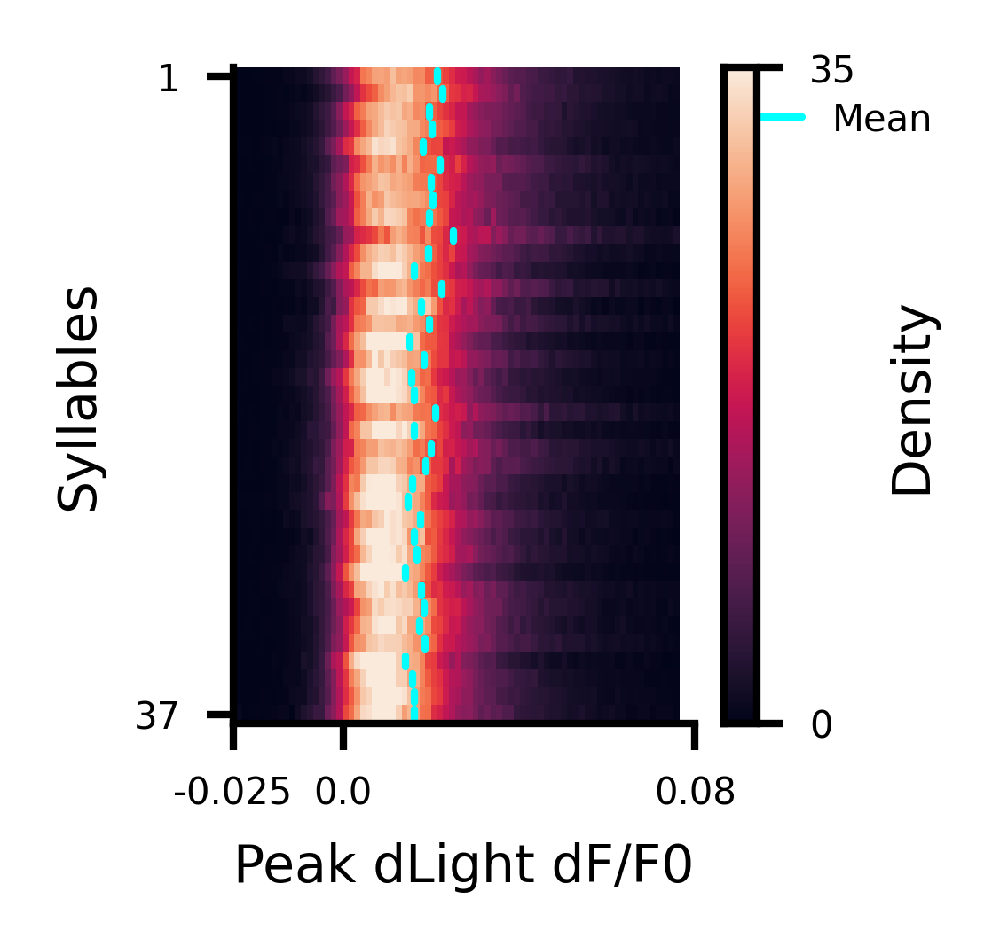

In [60]:
pad = 0.2
fig = fg(1.4, 1.6)
fig.dpi = 300
ax = fig.gca()
im = ax.imshow(
    dists, aspect="auto", extent=(x[0], x[-1], len(sorting), 0), vmax=35, interpolation="none"
)
cb = fig.colorbar(im, ax=ax, label="Density")
cb.set_ticks([0, 35])
for i in range(len(avgs)):
    plt.plot((avgs[i],) * 2, (i + pad, i + (1 - pad)), lw=1, c="cyan", label='Mean' if i == 0 else None)
ax.set(
    xlabel="Peak dLight dF/F0",
    ylabel="Syllables",
    yticks=[0.5, len(sorting) - 0.5],
    yticklabels=[1, len(sorting)],
    ylim=(len(sorting), 0),
    xlim=(-0.025, 0.08),
)
clean_ticks(ax, axis="x", zero_symmetry=False, precision=3)
sns.despine(left=True)
add_legend(ax)
saver(fig, "prob-density-of-raw-dlight-instances");

In [140]:
avg_peak_dlight = feat_df2.groupby(['uuid', 'labels'], observed=True)['max'].median().reset_index()

In [141]:
avg_peak_dlight

,uuid,labels,max
0,324bfd92-6a8e-4d43-bf31-cf7424255d9f,4.0,0.011208
1,324bfd92-6a8e-4d43-bf31-cf7424255d9f,5.0,0.015669
2,324bfd92-6a8e-4d43-bf31-cf7424255d9f,7.0,0.010547
3,324bfd92-6a8e-4d43-bf31-cf7424255d9f,8.0,0.013899
4,324bfd92-6a8e-4d43-bf31-cf7424255d9f,10.0,0.013307
...,...,...,...
12388,34a9198b-9a25-4f7a-8258-a3eac074a89b,86.0,0.020629
12389,34a9198b-9a25-4f7a-8258-a3eac074a89b,91.0,0.016091
12390,34a9198b-9a25-4f7a-8258-a3eac074a89b,92.0,0.013960
12391,34a9198b-9a25-4f7a-8258-a3eac074a89b,94.0,0.026074


In [142]:
# mean sorting
v = avg_peak_dlight.groupby('labels')['max'].mean()
v = v.sort_values(ascending=False)

## Plot distribution of avg DA peaks per session and per syllable

In [152]:
quant_range = 0.99
edges = np.histogram_bin_edges(
    avg_peak_dlight["max"].dropna(),
    bins=35,
    range=(-0.005, avg_peak_dlight["max"].quantile(quant_range)),
)
x = edges[:-1] + (np.diff(edges) / 2)

avg_dists = []
avg_means = []
# for syll in filter(lambda syll: syll in sorting, v.index):
for syll in sorting:
    tmp = avg_peak_dlight.loc[avg_peak_dlight["labels"] == syll, "max"]
    dist, _bins = np.histogram(tmp, edges, density=True)
    avg_dists.append(dist)
    avg_means.append(tmp.mean())

avg_dists = np.array(avg_dists)

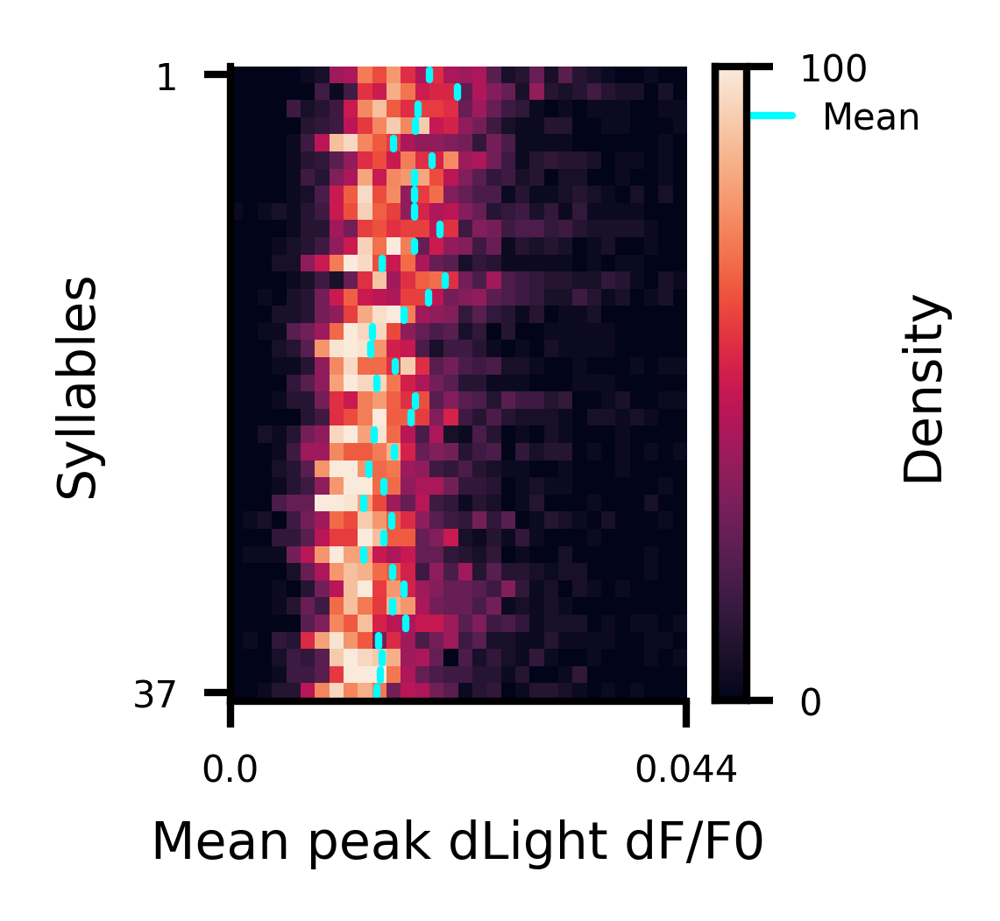

In [153]:
pad = 0.2
fig = fg(1.4, 1.6)
fig.dpi = 300
ax = fig.gca()
im = ax.imshow(
    avg_dists,
    aspect="auto",
    extent=(x[0], x[-1], len(sorting), 0),
    vmax=100,
    interpolation="none",
)
cb = fig.colorbar(im, ax=ax, label="Density")
for i in range(len(avg_dists)):
    plt.plot((avg_means[i],) * 2, (i + pad, i + (1 - pad)), lw=1, c="cyan", label='Mean' if i == 0 else None)
cb.set_ticks([0, 100])
ax.set(
    xlabel="Mean peak dLight dF/F0",
    ylabel="Syllables",
    yticks=[0.5, len(sorting) - 0.5],
    yticklabels=[1, len(sorting)],
    ylim=(len(sorting), 0),
    xlim=(0, None),
)
clean_ticks(ax, axis="x", dtype=float, zero_symmetry=False, precision=3)
sns.despine()
add_legend(ax)
saver(fig, "prob-density-of-avg-raw-dlight-across-sessions");